# ArchPy2Modflow: paper examples

In [1]:
import numpy as np
import pandas as pd
import matplotlib
from matplotlib import colors
import matplotlib.pyplot as plt
import geone
import geone.covModel as gcm
import geone.imgplot3d as imgplt3
import pyvista as pv
import sys
import os

# auto reload modules
%load_ext autoreload
%autoreload 2

sys.path.append("../../")

#my modules
from ArchPy.base import *
from ArchPy.tpgs import *

In [2]:
#grid
sx = 1.5
sy = 1.5
sz = .15
x0 = 0
y0 = 0
z0 = -15
nx = 100
ny = 50
nz = 50
x1 = x0 + nx*sx
y1 = y0 + ny*sy
z1 = z0 + nz*sz

dimensions = (nx, ny, nz)
spacing = (sx, sy, sz)
origin = (x0, y0, z0)  

In [3]:
## create pile

P1 = Pile(name = "P1",seed=1)

#units covmodel
covmodelD = gcm.CovModel2D(elem=[('cubic', {'w':0.6, 'r':[30,30]})])
covmodelD1 = gcm.CovModel2D(elem=[('cubic', {'w':0.2, 'r':[30,30]})])
covmodelC = gcm.CovModel2D(elem=[('cubic', {'w':0.2, 'r':[40,40]})])
covmodelB = gcm.CovModel2D(elem=[('cubic', {'w':0.6, 'r':[30,30]})])
covmodel_er = gcm.CovModel2D(elem=[('spherical', {'w':1, 'r':[50,50]})])

# facies covmodels
covmodel_f_B_gravel = gcm.CovModel3D(elem=[('spherical', {'w':0.6*0.4, 'r':[20, 20, 2]})])
covmodel_f_B_sand = gcm.CovModel3D(elem=[('spherical', {'w':0.3*0.7, 'r':[20, 20, 2]})])
covmodel_f_B_clay = gcm.CovModel3D(elem=[('spherical', {'w':0.1*0.9, 'r':[30, 30, 0.5]})])

#create Lithologies 
dic_s_D = {"int_method" : "grf_ineq","covmodel" : covmodelD}
dic_f_D = {"f_method":"homogenous"}
D = Unit(name="D",order=1,ID = 1,color="gold",contact="onlap",surface=Surface(contact="onlap",dic_surf=dic_s_D)
         ,dic_facies=dic_f_D)

dic_s_C = {"int_method" : "grf_ineq","covmodel" : covmodelC, "mean":-8.5}
dic_f_C = {"f_method":"homogenous"}
C = Unit(name="C", order=2, ID = 2, color="blue", contact="onlap", dic_facies=dic_f_C, surface=Surface(dic_surf=dic_s_C, contact="onlap"))

dic_s_B = {"int_method" : "grf_ineq","covmodel" : covmodelB, "mean":-9.5}
dic_f_B = {"f_method":"SIS", "f_covmodel":[covmodel_f_B_sand, covmodel_f_B_gravel, covmodel_f_B_clay], "probability":[0.3, 0.6, 0.1]}
B = Unit(name="B",order=3,ID = 3,color="violet",contact="onlap",dic_facies=dic_f_B,surface=Surface(contact="onlap",dic_surf=dic_s_B))

dic_s_A = {"int_method":"grf_ineq","covmodel": covmodelB, "mean":-13}
dic_f_A = {"f_method":"homogenous"}
A = Unit(name="A",order=4, ID = 4,color="red",contact="onlap",dic_facies=dic_f_A,surface=Surface(dic_surf = dic_s_A,contact="onlap"))

#Master pile
P1.add_unit([D,C,B,A])

Unit D: Surface added for interpolation
Unit C: Surface added for interpolation
Unit B: Surface added for interpolation
Unit A: Surface added for interpolation
Stratigraphic unit D added ✅
Stratigraphic unit C added ✅
Stratigraphic unit B added ✅
Stratigraphic unit A added ✅


In [4]:
# covmodels for the property model
covmodelK = gcm.CovModel3D(elem=[("exponential",{"w":0.3,"r":[30,30,10]})],alpha=-20,name="K_vario")
covmodelK2 = gcm.CovModel3D(elem=[("spherical",{"w":0.1,"r":[20,20, 5]})],alpha=0,name="K_vario_2")

facies_1 = Facies(ID = 1,name="Sand",color="yellow")
facies_2 = Facies(ID = 2,name="Gravel",color="lightgreen")
facies_4 = Facies(ID = 4,name="Clay",color="blue")
facies_7 = Facies(ID = 7,name="basement",color="red")

A.add_facies([facies_7])
B.add_facies([facies_1, facies_2, facies_4])
D.add_facies([facies_1])
C.add_facies([facies_4])

# property model

# K
# cm_prop1 = gcm.CovModel3D(elem = [("spherical", {"w":0.5, "r":[10, 10, 10]}),
#                                   ("cubic", {"w":0.5, "r":[15, 15, 15]})])
cm_prop2 = gcm.CovModel3D(elem = [("cubic", {"w":0.25, "r":[25, 25, 25]})])

list_facies = [facies_1, facies_2, facies_4, facies_7]
means = [-3.5, -2, -8, -10]
prop_model = ArchPy.base.Prop("K",
                              facies = list_facies,
                              covmodels = [cm_prop2, cm_prop2, cm_prop2, cm_prop2],
                                means = means,
                                int_method = ["sgs", "sgs", "sgs", "homogenous"],
                                vmin = -10,
                                vmax = -1
                                )

# porosity
cm_prop2_sand = gcm.CovModel3D(elem = [("cubic", {"w":0.005, "r":[15, 15, 15]})])
cm_prop2_gravel = gcm.CovModel3D(elem = [("cubic", {"w":0.005, "r":[15, 15, 15]})])
cm_prop2_clay = gcm.CovModel3D(elem = [("cubic", {"w":0.026, "r":[15, 15, 15]})])
cm_prop2_basement = gcm.CovModel3D(elem = [("cubic", {"w":0.0218, "r":[15, 15, 15]})])

porosity = ArchPy.base.Prop("Porosity",
                            facies = list_facies,
                            covmodels = [cm_prop2_sand, cm_prop2_gravel, cm_prop2_clay, cm_prop2_basement],
                            # means = [0.3, 0.3, 0.1, 0.05],
                            means = [-0.37, -0.37, -0.958, -1.30],
                            int_method = ["sgs", "sgs", "sgs", "homogenous"],
                            vmin = 0,
                            vmax = 0.4,
                            log_void_ratio=True
                            )

# alh
long_disp = ArchPy.base.Prop("long_disp",
                            facies = list_facies,
                            covmodels = None,
                            # means = [1.5, 1.5, 1.5, 1.5],
                            means = [10, 10, 10, 10],
                            int_method = ["homogenous", "homogenous", "homogenous", "homogenous"],
                            vmin = 0
                            )

Facies basement added to unit A ✅
Facies Sand added to unit B ✅
Facies Gravel added to unit B ✅
Facies Clay added to unit B ✅
Facies Sand added to unit D ✅
Facies Clay added to unit C ✅


In [5]:
porosity.log_void_ratio

True

In [6]:
top = np.ones([ny,nx])*z1
bot = np.ones([ny,nx])*z0

In [7]:
T1 = Arch_table(name = "P1",seed=1)
T1.set_Pile_master(P1)
T1.add_grid(dimensions, spacing, origin, top=top,bot=bot)
T1.add_prop([prop_model, porosity, long_disp])

Pile sets as Pile master
## Adding Grid ##
## Grid added and is now simulation grid ##
Property K added
Property Porosity added
Property long_disp added


In [8]:
T1.get_sp(unit_kws=["covmodel"], facies_kws=["probability", "f_covmodel"])[0]

,name,contact,int_method,covmodel,filling_method,list_facies,probability,f_covmodel
0,D,onlap,grf_ineq,"0: cub (w: 0.6, r: [30, 30])",homogenous,[Sand],None,None
1,C,onlap,grf_ineq,"0: cub (w: 0.2, r: [40, 40])",homogenous,[Clay],None,None
2,B,onlap,grf_ineq,"0: cub (w: 0.6, r: [30, 30])",SIS,"[Sand, Gravel, Clay]","[0.3, 0.6, 0.1]","Sand : 0: sph (w: 0.21, r: [20, 20, 2]) | Gravel : 0: sph (w: 0.24, r: [20, 20, 2]) | Clay : 0: sph (w: 0.09000000000000001, r: [30, 30, 0.5]) |"
3,A,onlap,grf_ineq,"0: cub (w: 0.6, r: [30, 30])",homogenous,[basement],None,None


In [9]:
T1.get_sp()[1]

,name,property,mean,covmodels
0,Sand,K,-3.500000,"0: cub (w: 0.25, r: [25, 25, 25])"
1,Sand,Porosity,-0.370000,"0: cub (w: 0.005, r: [15, 15, 15])"
2,Sand,long_disp,10.000000,None
3,Clay,K,-8.000000,"0: cub (w: 0.25, r: [25, 25, 25])"
4,Clay,Porosity,-0.958000,"0: cub (w: 0.026, r: [15, 15, 15])"
5,Clay,long_disp,10.000000,None
6,Gravel,K,-2.000000,"0: cub (w: 0.25, r: [25, 25, 25])"
7,Gravel,Porosity,-0.370000,"0: cub (w: 0.005, r: [15, 15, 15])"
8,Gravel,long_disp,10.000000,None
9,basement,K,-10.000000,"0: cub (w: 0.25, r: [25, 25, 25])"


In [10]:
T1.compute_surf(1)
T1.compute_facies(1)
T1.compute_prop(1)

Boreholes not processed, fully unconditional simulations will be tempted
########## PILE P1 ##########
Pile P1: ordering units
Stratigraphic units have been sorted according to order

#### COMPUTING SURFACE OF UNIT A
A: time elapsed for computing surface 0.22097539901733398 s

#### COMPUTING SURFACE OF UNIT B
B: time elapsed for computing surface 0.06750726699829102 s

#### COMPUTING SURFACE OF UNIT C
C: time elapsed for computing surface 0.06752967834472656 s

#### COMPUTING SURFACE OF UNIT D
D: time elapsed for computing surface 0.0 s

Time elapsed for getting domains 0.008999824523925781 s
##########################


### 0.37401270866394043: Total time elapsed for computing surfaces ###

### Unit D: facies simulation with homogenous method ####
### Unit D - realization 0 ###
Time elapsed 0.0 s

### Unit C: facies simulation with homogenous method ####
### Unit C - realization 0 ###
Time elapsed 0.0 s

### Unit B: facies simulation with SIS method ####
### Unit B - realization 0 ###

Test upscaling disp

In [11]:
pv.set_jupyter_backend("static")

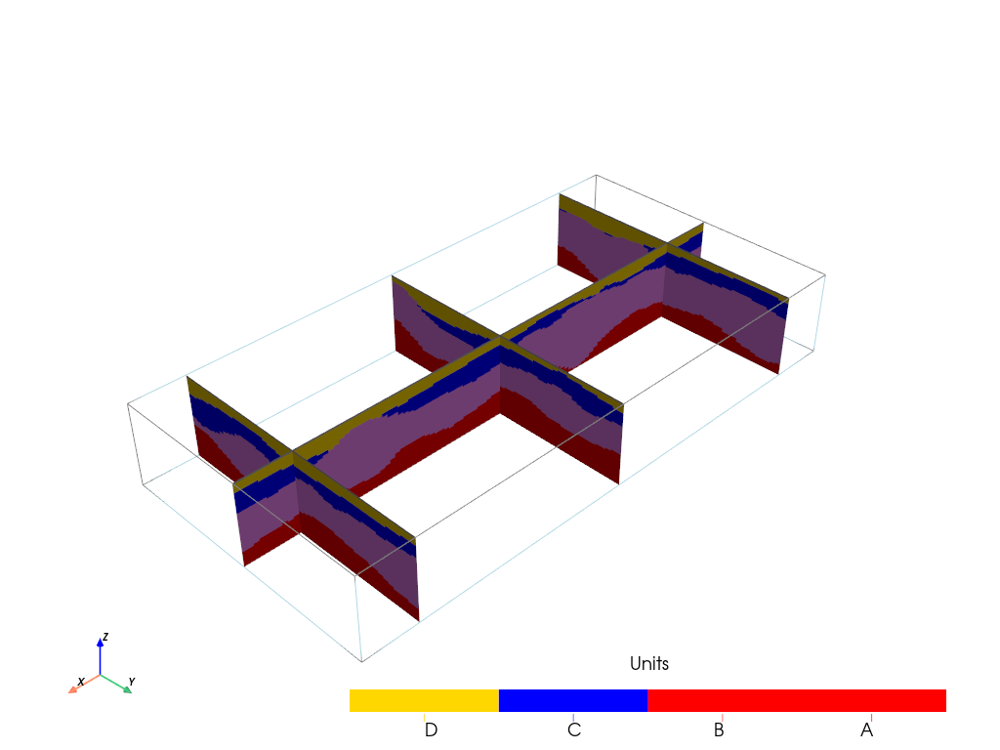

In [12]:

T1.plot_units(v_ex=3, slicex=(0.1, 0.5, 0.9), slicey=0.5)

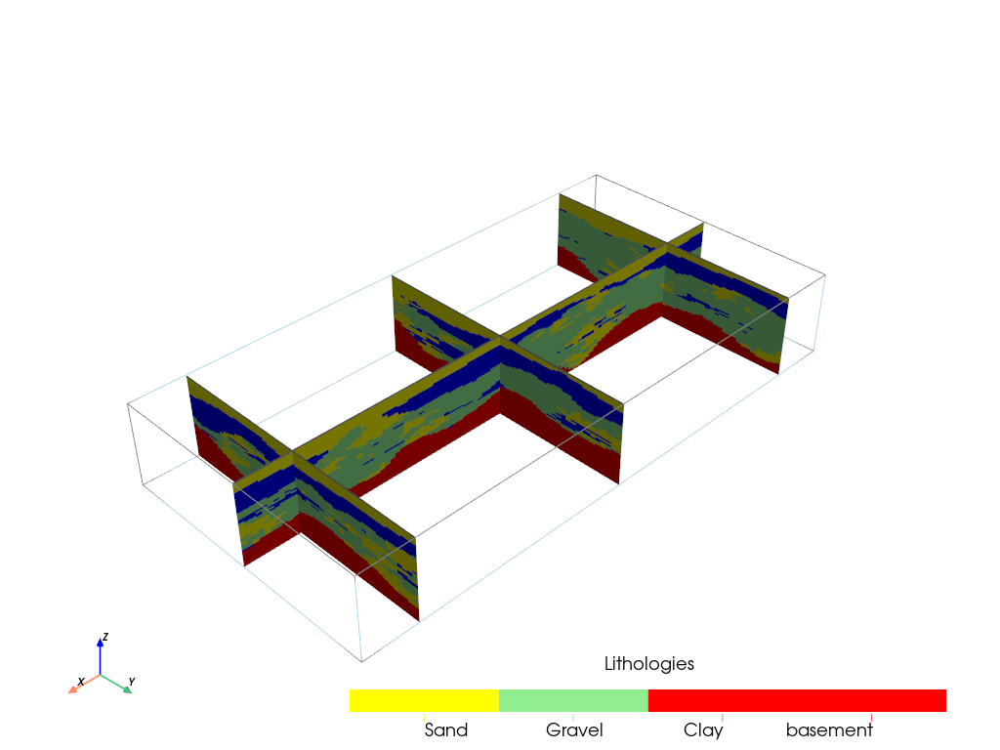

In [13]:

T1.plot_facies(v_ex=3, slicex=(0.1, 0.5, 0.9), slicey=0.5)

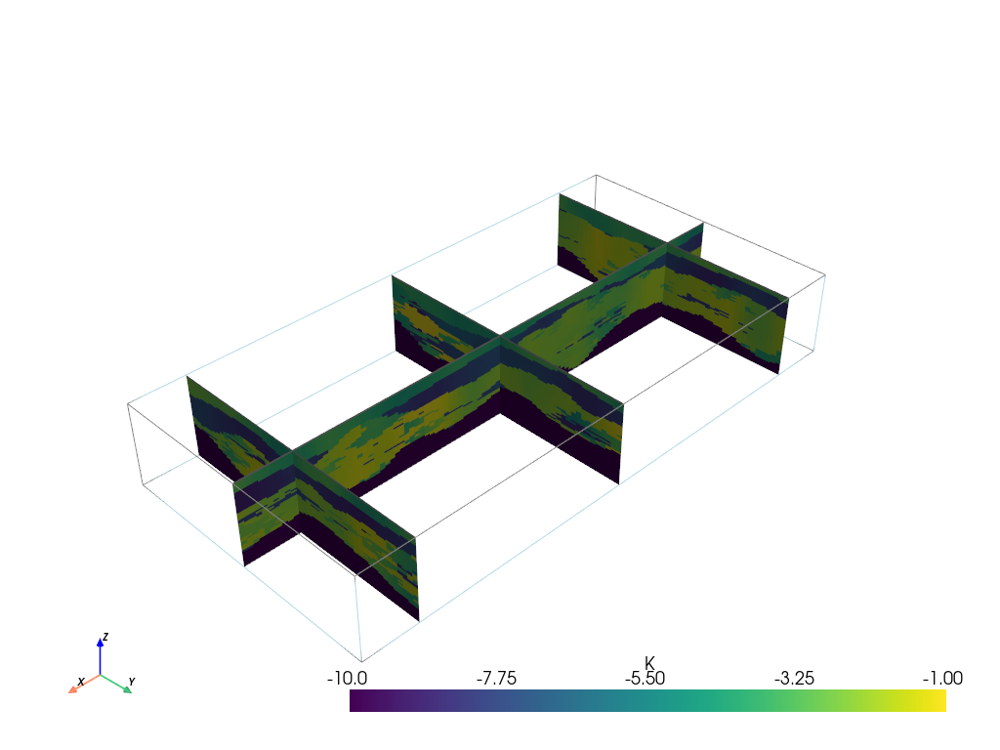

In [14]:

T1.plot_prop("K", v_ex=3, slicex=(0.1, 0.5, 0.9), slicey=0.5)

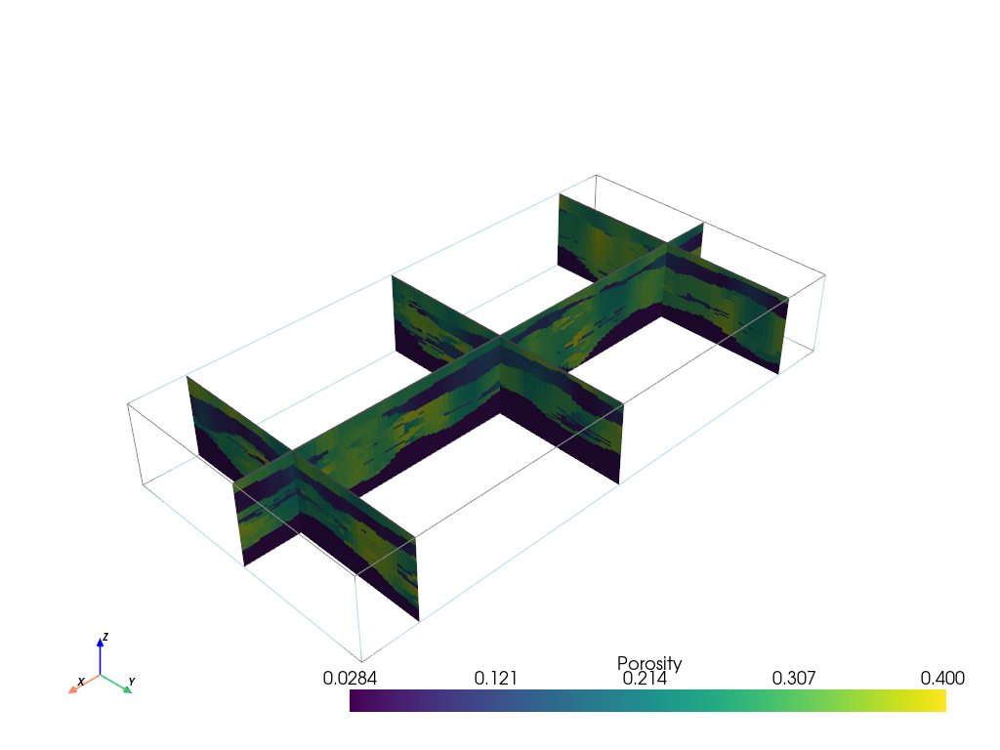

In [15]:
T1.plot_prop("Porosity", v_ex=3, slicex=(0.1, 0.5, 0.9), slicey=0.5)

In [16]:
# ArchPy.inputs.save_project(T1)

## Heterogeneous

### Flow model

In [17]:
import ArchPy.ap_mf
from ArchPy.ap_mf import archpy2modflow, array2cellids
import flopy as fp

In [18]:
mf6_exe_path = "../../../../exe/mf6.exe"

In [58]:
archpy_flow = archpy2modflow(T1, exe_name=mf6_exe_path, model_dir="layered_hetero")  # create the modflow model
archpy_flow.create_sim(grid_mode="layers", iu=0, unit_limit=None, lay_sep=[1, 1, 3, 1], factor_x=2, factor_y=2, factor_z=2)  # create the simulation object and choose a certain discretization

Simulation created with the following parameters:
Grid mode: layers
To retrieve the simulation, use the get_sim() method


In [59]:
archpy_flow.set_k("K", iu=0, ifa=0, ip=0, log=True, k_average_method="anisotropic", average_facies=True)  # set the hydraulic conductivity

In [60]:
sim = archpy_flow.get_sim()
gwf = archpy_flow.get_gwf()

In [61]:
sim.ims.remove()
inner_dvclose = 1e-5
ims = fp.mf6.ModflowIms(sim, complexity="moderate", inner_dvclose=inner_dvclose)

In [62]:
# add BC at left and right on all layers
h1 = .3
h2 = 0
T_1 = 10  # temperature at left boundary
T_2 = 10  # temperature at right boundary
chd_data = []

a = np.zeros((gwf.modelgrid.nlay, gwf.modelgrid.nrow, gwf.modelgrid.ncol), dtype=bool)
a[:, :, 0] = 1
lst_chd = array2cellids(a, gwf.dis.idomain.array)
for cellid in lst_chd:
    chd_data.append((cellid, h1, T_1))

chd1 = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_data, save_flows=True, auxiliary="TEMPERATURE", pname="CHD-1")

chd_data = []
a = np.zeros((gwf.modelgrid.nlay, gwf.modelgrid.nrow, gwf.modelgrid.ncol), dtype=bool)
a[:, :, -1] = 1
lst_chd = array2cellids(a, gwf.dis.idomain.array)
for cellid in lst_chd:
    chd_data.append((cellid, h2, T_2))

chd2 = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_data, save_flows=True, auxiliary="TEMPERATURE", pname="CHD-2")

In [63]:
# add an injection well in the middle of the model
well_data = []
Q_well = 0.0015  # m3/s
T_well = 7  # temperature of the injected water
cellid_well = (2, T1.ny // 2, T1.nx // 2)
well_data.append((cellid_well, Q_well, T_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, auxiliary="TEMPERATURE", pname="WEL-INJ")

# production well
well_data = []
Q_well = -Q_well # m3/s
cellid_well = (2, T1.ny // 2, int(T1.nx // 2.5))
well_data.append((cellid_well, Q_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, pname="WEL-PROD")

In [64]:
sim.write_simulation()
sim.run_simulation()

writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ims_-1...
  writing model test...
    writing model name file...
    writing package dis...
    writing package ic...
    writing package oc...
    writing package npf...
    writing package chd-1...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 300 based on size of stress_period_data
    writing package chd-2...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 297 based on size of stress_period_data
    writing package wel-inj...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
    writing package wel-prod...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURV

(True, [])

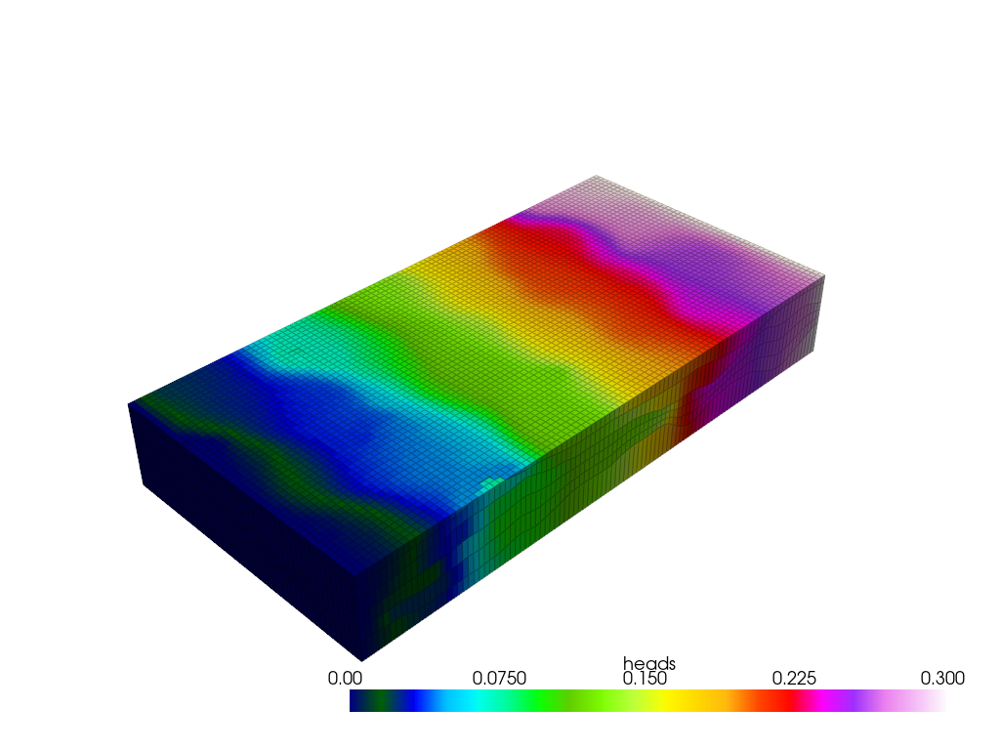

In [65]:
from flopy.export.vtk import Vtk

vert_exag = 3
vtk = Vtk(model=gwf, binary=False, vertical_exageration=vert_exag, smooth=True)
vtk.add_model(gwf)

# add different arrays to the vtk object
heads = archpy_flow.get_heads()
vtk.add_array(heads, name="heads")
vtk.add_array(np.log10(gwf.npf.k.array), name="K")
vtk.add_array(np.log10(gwf.npf.k33.array), name="Kzz")
vtk.add_array(gwf.npf.k.array / gwf.npf.k33.array, name="aniso")
# vtk.add_array(np.flip(archpy_flow.upscaled_facies[1], axis=1), name="prop")

gwf_mesh = vtk.to_pyvista()
ghosts = np.argwhere(gwf_mesh["idomain"] <= 0)
gwf_mesh.remove_cells(ghosts, inplace=True)

pl = pv.Plotter(notebook=True)
pl.add_mesh(gwf_mesh, opacity=1, show_edges=True, scalars="heads", cmap="gist_ncar", edge_opacity=.3, clim=[0, 0.3])

# pl.show(screenshot="../../../figures/articles/archpy 2/raw/flow_lay_he.png", window_size=[1300, 900], auto_close=False)
# pl.show(screenshot="E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_lay_he.png", window_size=[1300, 900], auto_close=False)
pl.show()

In [66]:
heads = archpy_flow.get_heads()

In [67]:
# default font size
matplotlib.rcParams.update({'font.size': 20})

Text(0, 0.5, 'Z [m]')

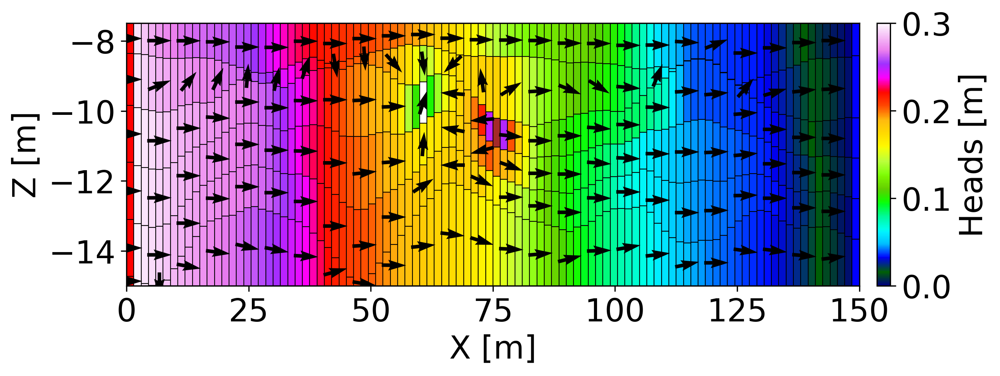

In [68]:
cobj = gwf.output.budget()
qx, qy, qz = fp.utils.postprocessing.get_specific_discharge(
        cobj.get_data(text="DATA-SPDIS", kstpkper=(0, 0))[0], gwf)

# plot cross section
from flopy.plot import PlotCrossSection
fig, ax = plt.subplots(1, 1, figsize=(10, 3), dpi=300)
cross_section = PlotCrossSection(model=gwf, line={"row": 25})
# cross_section.plot_array(np.log10(gwf.npf.k.array), cmap="Blues", ax=ax)
cont = cross_section.plot_array(heads, cmap="gist_ncar", ax=ax, vmin=0, vmax=0.3)
# cont = cross_section.contour_array(heads, ax=ax, levels=np.arange(0, 0.25, 0.02), linewidths=3)
# plt.clabel(cont, inline=True, fontsize=20, fmt="%.2f", colors="black")
cross_section.plot_bc("CHD-1", color="red", ax=ax)
cross_section.plot_bc("CHD-2", color="blue", ax=ax)
cross_section.plot_bc("WEL-INJ", color="brown", ax=ax)
cross_section.plot_bc("WEL-PROD", color="white", ax=ax)
cross_section.plot_vector(qx, qy, qz, color="black", normalize=True, hstep=4, kstep=1, ax=ax, scale=30)
cross_section.plot_grid(linewidth=0.5, color="black")
plt.colorbar(cont, ax=ax, label="Heads [m]", orientation="vertical", pad=0.02)
plt.xlabel("X [m]")
plt.ylabel("Z [m]")

# fig.savefig("E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_lay_he_cross_section.png", dpi=300, bbox_inches="tight")

In [69]:
np.random.seed(15)

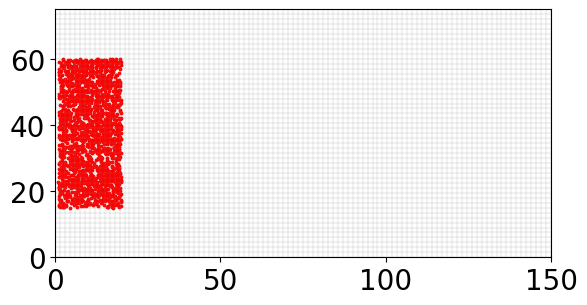

In [70]:
n = 2000
xp = np.random.uniform(1, 20, n)
yp = np.random.uniform(T1.yg[-1]*0.2 + T1.yg[0], T1.yg[-1]*0.8, n)
zp = np.random.uniform(-9, -11, n)
list_p_coords = []
for i in range(n):
    list_p_coords.append((xp[i], yp[i], zp[i]))
plt.scatter(xp, yp, c="red", s=3)
gwf.modelgrid.plot(alpha=.1)

In [71]:
archpy_flow.prt_create(prt_name="test_prt", workspace="ws_prt", trackdir="forward", list_p_coords=list_p_coords)
archpy_flow.set_porosity(prop_key="Porosity", iu=0, ifa=0, ip=0)
archpy_flow.prt_run(silent=False)

c:\Users\schorppl\.conda\envs\archpy_work\Lib\site-packages\flopy\utils\gridintersect.py:123: DeprecationWarning: Note `method="structured"` is deprecated. Pass `method="vertex"` to silence this warning. This will be the new default in a future release and this keyword argument will be removed.
  warnings.warn(


writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ems...
  writing model test_prt...
    writing model name file...
    writing package mip...
    writing package dis...
    writing package prp...
    writing package oc...
    writing package fmi...
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.6.1 02/10/2025

   MODFLOW 6 compiled Feb 14 2025 13:40:10 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to furt

In [72]:
df_all = archpy_flow.prt_get_pathlines()

In [73]:
plt.style.use('seaborn-v0_8-pastel')

In [74]:
# default font size
matplotlib.rcParams.update({'font.size': 8})

Text(0, 0.5, 'Y [m]')

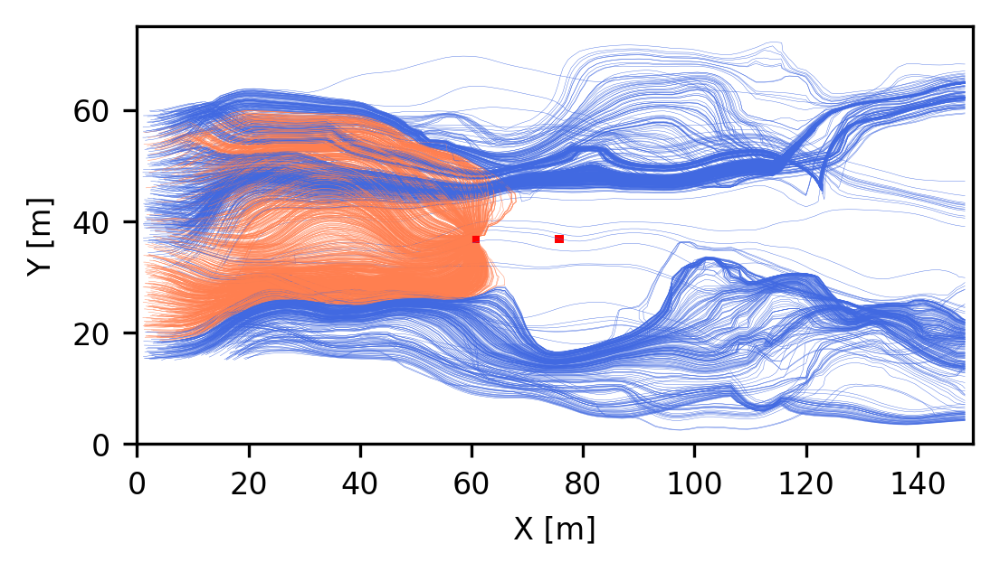

In [75]:
plt.figure(figsize=(5, 2), dpi=300)

ml = fp.plot.PlotMapView(model=gwf, layer=2)
ml.plot_bc("WEL")
for i in range(1, 2000):
    xmax = df_all.loc[df_all.irpt==i].iloc[-1].x
    path = df_all.loc[df_all.irpt == i]
    if xmax < 65:
        plt.plot(path["x"], path["y"], linewidth=.1, color="coral")
    else: 
        plt.plot(path["x"], path["y"], linewidth=.1, color="royalblue")


plt.xlabel("X [m]")
plt.ylabel("Y [m]")

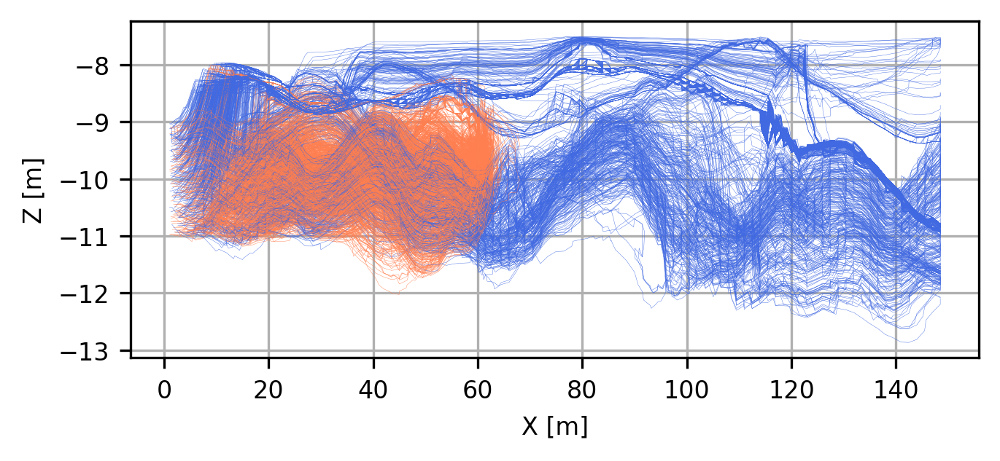

In [76]:
plt.figure(figsize=(5, 2), dpi=300)

# gwf.modelgrid.plot(alpha=.1)
for i in range(1, 2000):
    xmax = df_all.loc[df_all.irpt==i].iloc[-1].x
    path = df_all.loc[df_all.irpt == i]
    if xmax < 65:
        plt.plot(path["x"], path["z"], linewidth=.1, color="coral")
    else: 
        plt.plot(path["x"], path["z"], linewidth=.1, color="royalblue")
plt.xlabel("X [m]")
plt.ylabel("Z [m]")
plt.grid()

In [77]:
t_well_layhe = []
t_bc_layhe = []
for i in range(1, 2000):
    xmax = df_all.loc[df_all.irpt==i].iloc[-1].x
    if xmax < 65:
        t_well_layhe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)
    else:
        t_bc_layhe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)

t_well_layhe = np.array(t_well_layhe)
t_bc_layhe = np.array(t_bc_layhe)
np.save("t_well_layhe.npy", t_well_layhe)
np.save("t_bc_layhe.npy", t_bc_layhe)

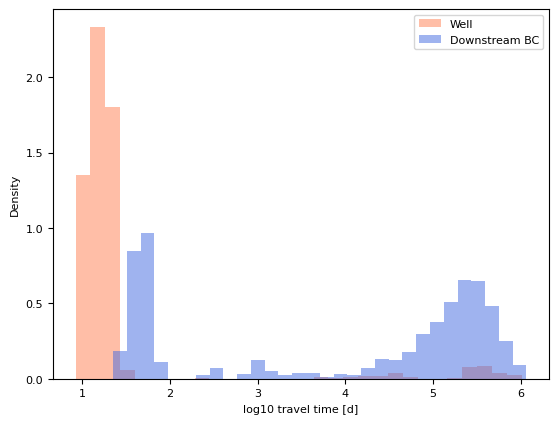

In [78]:
plt.hist(np.log10(t_well_layhe / 86400), density=True, alpha=.5, label="Well", color="coral", bins=30)
plt.hist(np.log10(t_bc_layhe / 86400), density=True, alpha=.5, label="Downstream BC", color="royalblue", bins=30)

plt.xlabel("log10 travel time [d]")
plt.ylabel("Density")

plt.legend()

In [79]:
import ArchPy.ap_mf
# default font size
matplotlib.rcParams.update({'font.size': 8})

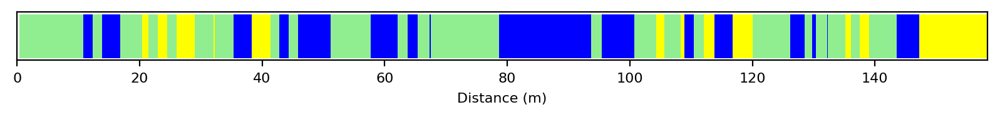

In [81]:
df_p = archpy_flow.prt_get_facies_path_particle(1426, facies_archpy=True)
ArchPy.ap_mf.plot_particle_facies_sequence(T1, df=df_p, plot_distance=True, proportions=False, plot_time=False)

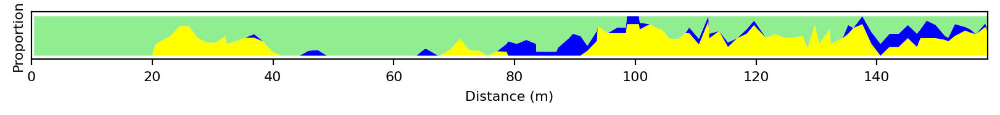

In [82]:
df_p = archpy_flow.prt_get_facies_path_particle(1426)
ArchPy.ap_mf.plot_particle_facies_sequence(T1, df=df_p, plot_distance=True, proportions=True, plot_time=False)

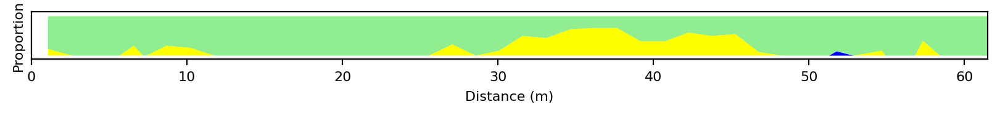

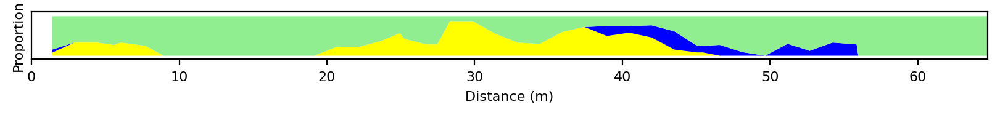

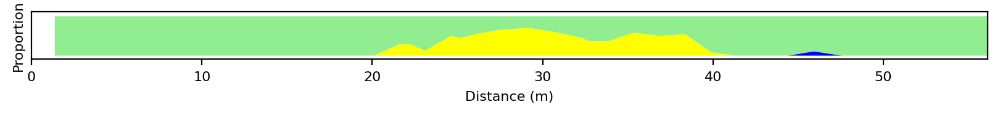

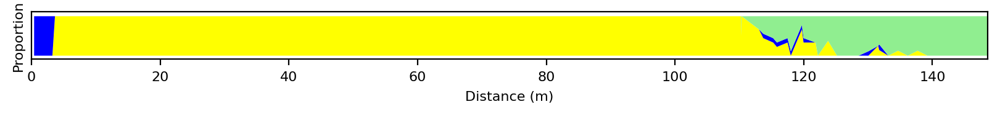

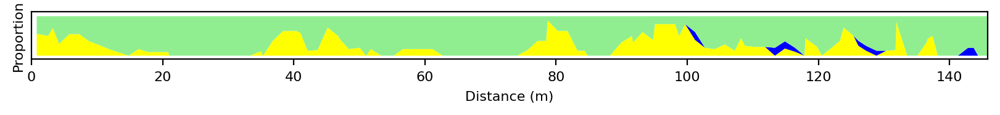

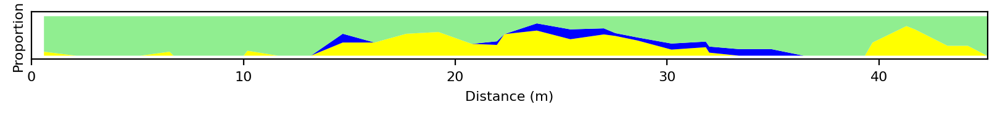

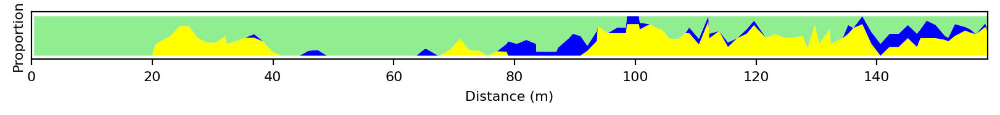

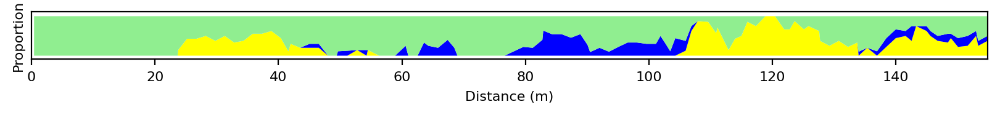

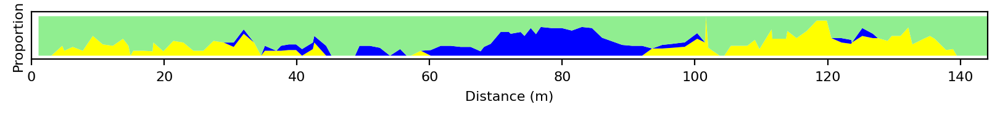

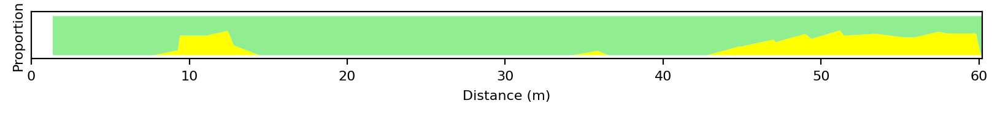

In [83]:
np.random.seed(1312)
for i in range(10):
    ip = np.random.randint(2000)
    df_p = archpy_flow.prt_get_facies_path_particle(ip)
    ArchPy.ap_mf.plot_particle_facies_sequence(T1, df=df_p, plot_distance=True, proportions=True, plot_time=False)

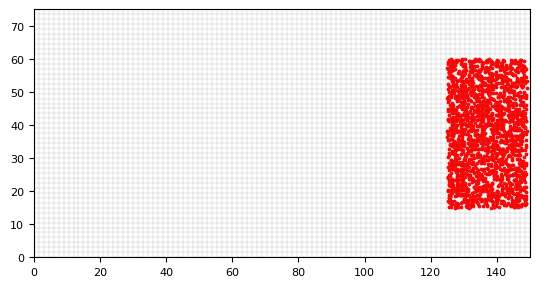

In [84]:
n = 2000
xp = np.random.uniform(125, 149, n)
yp = np.random.uniform(T1.yg[-1]*0.2 + T1.yg[0], T1.yg[-1]*0.8, n)
zp = np.random.uniform(-9, -11, n)
list_p_coords = []
for i in range(n):
    list_p_coords.append((xp[i], yp[i], zp[i]))
plt.scatter(xp, yp, c="red", s=3)
gwf.modelgrid.plot(alpha=.1)

In [85]:
archpy_flow.prt_create(prt_name="test_prt", workspace="ws_prt", trackdir="backward", list_p_coords=list_p_coords)
archpy_flow.set_porosity(prop_key="Porosity", iu=0, ifa=0, ip=0)
archpy_flow.prt_run(silent=False)

c:\Users\schorppl\.conda\envs\archpy_work\Lib\site-packages\flopy\utils\gridintersect.py:123: DeprecationWarning: Note `method="structured"` is deprecated. Pass `method="vertex"` to silence this warning. This will be the new default in a future release and this keyword argument will be removed.
  warnings.warn(


writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ems...
  writing model test_prt...
    writing model name file...
    writing package mip...
    writing package dis...
    writing package prp...
    writing package oc...
    writing package fmi...
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.6.1 02/10/2025

   MODFLOW 6 compiled Feb 14 2025 13:40:10 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to furt

In [86]:
df_all = archpy_flow.prt_get_pathlines()

Text(0, 0.5, 'Y [m]')

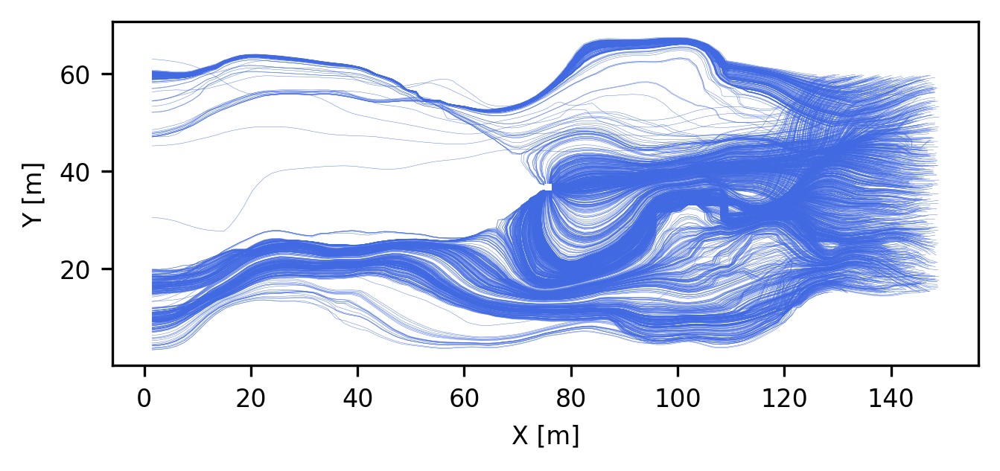

In [87]:
plt.figure(figsize=(5, 2), dpi=300)

# gwf.modelgrid.plot(alpha=.1)
for i in range(1, 2000):
    path = df_all.loc[df_all.irpt == i]
    plt.plot(path["x"], path["y"], linewidth=.1, color="royalblue")

plt.xlabel("X [m]")
plt.ylabel("Y [m]")

## ArchPy mode - heterogeneous

In [88]:
archpy_flow = archpy2modflow(T1, exe_name=mf6_exe_path, model_dir="archpy_mode_hetero")  # create the modflow model
archpy_flow.create_sim(grid_mode="archpy", iu=0, unit_limit=None)  # create the simulation object and choose a certain discretization
archpy_flow.set_k("K", iu=0, ifa=0, ip=0, log=True, k_average_method="anisotropic", average_facies=True)  # set the hydraulic conductivity

Simulation created with the following parameters:
Grid mode: archpy
To retrieve the simulation, use the get_sim() method


In [89]:
sim = archpy_flow.get_sim()
gwf = archpy_flow.get_gwf()

In [90]:
sim.ims.remove()
inner_dvclose = 1e-5
ims = fp.mf6.ModflowIms(sim, complexity="moderate", inner_dvclose=inner_dvclose)

In [91]:
import flopy as fp

In [92]:
# add BC at left and right on all layers
h1 = .3
h2 = 0
T_1 = 10  # temperature at left boundary
T_2 = 10  # temperature at right boundary
chd_data = []

a = np.zeros((gwf.modelgrid.nlay, gwf.modelgrid.nrow, gwf.modelgrid.ncol), dtype=bool)
a[:, :, 0] = 1
lst_chd = array2cellids(a, gwf.dis.idomain.array)
for cellid in lst_chd:
    chd_data.append((cellid, h1, T_1))

chd1 = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_data, save_flows=True, auxiliary="TEMPERATURE", pname="CHD-1")

chd_data = []
a = np.zeros((gwf.modelgrid.nlay, gwf.modelgrid.nrow, gwf.modelgrid.ncol), dtype=bool)
a[:, :, -1] = 1
lst_chd = array2cellids(a, gwf.dis.idomain.array)
for cellid in lst_chd:
    chd_data.append((cellid, h2, T_2))

chd2 = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_data, save_flows=True, auxiliary="TEMPERATURE", pname="CHD-2")

Wells at ($75.0, 25.0, 4.5$) and ($60.0, 25.0, 4.5$)

In [93]:
# add an injection well in the middle of the model
well_data = []
Q_well = 0.0015  # m3/s
T_well = 7  # temperature of the injected water
cellid_well = (21, T1.ny // 2, T1.nx // 2)
well_data.append((cellid_well, Q_well, T_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, auxiliary="TEMPERATURE", pname="WEL-INJ")

# production well
well_data = []
Q_well = -0.0015  # m3/s
cellid_well = (21, T1.ny // 2, int(T1.nx // 2.5))
well_data.append((cellid_well, Q_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, pname="WEL-PROD")

In [94]:
sim.write_simulation()
sim.run_simulation()

writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ims_-1...
  writing model test...
    writing model name file...
    writing package dis...
    writing package ic...
    writing package oc...
    writing package npf...
    writing package chd-1...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 2450 based on size of stress_period_data
    writing package chd-2...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 2450 based on size of stress_period_data
    writing package wel-inj...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
    writing package wel-prod...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SU

(True, [])

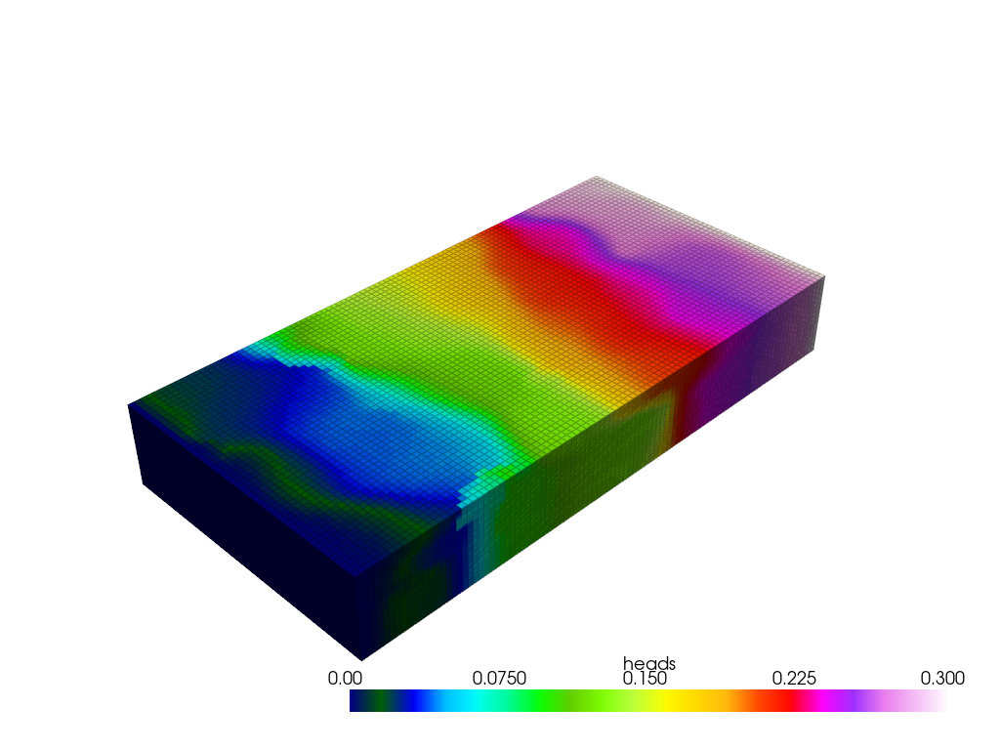

In [95]:
from flopy.export.vtk import Vtk

vert_exag = 3
vtk = Vtk(model=gwf, binary=False, vertical_exageration=vert_exag, smooth=True)
vtk.add_model(gwf)

heads = archpy_flow.get_heads()
vtk.add_array(heads, name="heads")
vtk.add_array(np.log10(gwf.npf.k.array), name="K")

gwf_mesh = vtk.to_pyvista()
ghosts = np.argwhere(gwf_mesh["idomain"] <= 0)
gwf_mesh.remove_cells(ghosts, inplace=True)

pl = pv.Plotter(notebook=True)
pl.add_mesh(gwf_mesh, opacity=1, show_edges=True, scalars="heads", cmap="gist_ncar", edge_opacity=0.3, clim=[0, 0.3])
# pl.show(screenshot="E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_archpy_he.png", window_size=[1300, 900], auto_close=False)
pl.show()

In [96]:
heads = archpy_flow.get_heads()

Text(0, 0.5, 'Z [m]')

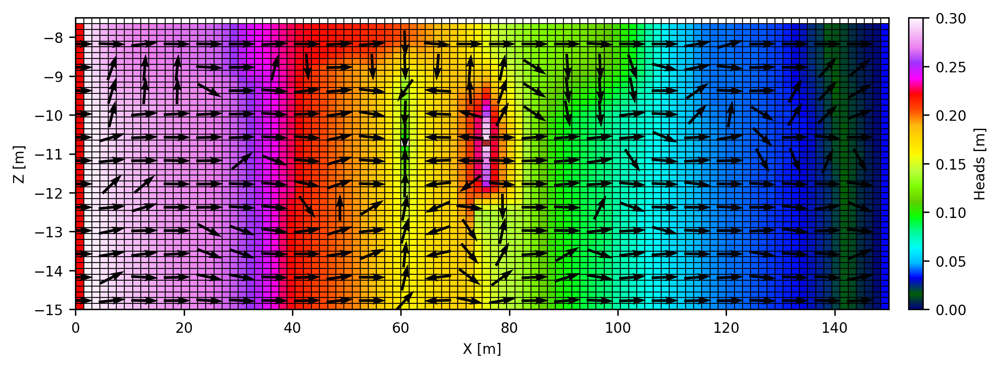

In [97]:
cobj = gwf.output.budget()
qx, qy, qz = fp.utils.postprocessing.get_specific_discharge(
        cobj.get_data(text="DATA-SPDIS", kstpkper=(0, 0))[0], gwf)

# plot cross section
from flopy.plot import PlotCrossSection
fig, ax = plt.subplots(1, 1, figsize=(10, 3), dpi=300)
cross_section = PlotCrossSection(model=gwf, line={"row": 25})
# cross_section.plot_array(np.log10(gwf.npf.k.array), cmap="Blues", ax=ax)
cont = cross_section.plot_array(heads, cmap="gist_ncar", ax=ax)
# cont = cross_section.contour_array(heads, ax=ax, levels=np.arange(0, 0.25, 0.02), linewidths=3)
# plt.clabel(cont, inline=True, fontsize=20, fmt="%.2f", colors="black")
cross_section.plot_bc("CHD-1", color="red", ax=ax)
cross_section.plot_bc("CHD-2", color="blue", ax=ax)
cross_section.plot_bc("WEL-INJ", color="brown", ax=ax)
cross_section.plot_bc("WEL-PROD", color="white", ax=ax)
cross_section.plot_vector(qx, qy, qz, color="black", normalize=True, kstep=4, hstep=4, ax=ax, scale=30)
cross_section.plot_grid(linewidth=0.5, color="black")
plt.colorbar(cont, ax=ax, label="Heads [m]", orientation="vertical", pad=0.02)
plt.xlabel("X [m]")
plt.ylabel("Z [m]")

# fig.savefig("E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/archpy_he_cross_section.png", dpi=300, bbox_inches="tight")

In [98]:
np.random.seed(15)

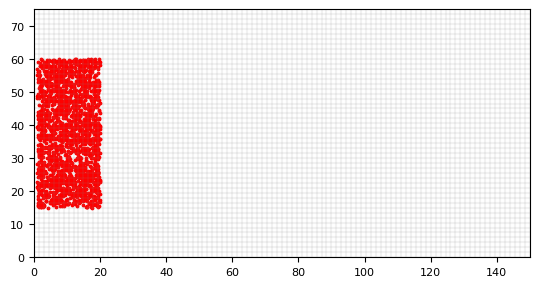

In [99]:
n = 2000
xp = np.random.uniform(1, 20, n)
yp = np.random.uniform(T1.yg[-1]*0.2 + T1.yg[0], T1.yg[-1]*0.8, n)
zp = np.random.uniform(-9, -11, n)
list_p_coords = []
for i in range(n):
    list_p_coords.append((xp[i], yp[i], zp[i]))
plt.scatter(xp, yp, c="red", s=3)
gwf.modelgrid.plot(alpha=.1)

In [100]:
archpy_flow.prt_create(prt_name="test_prt", workspace="ws_prt", trackdir="forward", list_p_coords=list_p_coords)
archpy_flow.set_porosity(prop_key="Porosity", iu=0, ifa=0, ip=0)
archpy_flow.prt_run(silent=False)

c:\Users\schorppl\.conda\envs\archpy_work\Lib\site-packages\flopy\utils\gridintersect.py:123: DeprecationWarning: Note `method="structured"` is deprecated. Pass `method="vertex"` to silence this warning. This will be the new default in a future release and this keyword argument will be removed.
  warnings.warn(


writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ems...
  writing model test_prt...
    writing model name file...
    writing package mip...
    writing package dis...
    writing package prp...
    writing package oc...
    writing package fmi...
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.6.1 02/10/2025

   MODFLOW 6 compiled Feb 14 2025 13:40:10 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to furt

In [101]:
df_all = archpy_flow.prt_get_pathlines()

Text(0, 0.5, 'Y [m]')

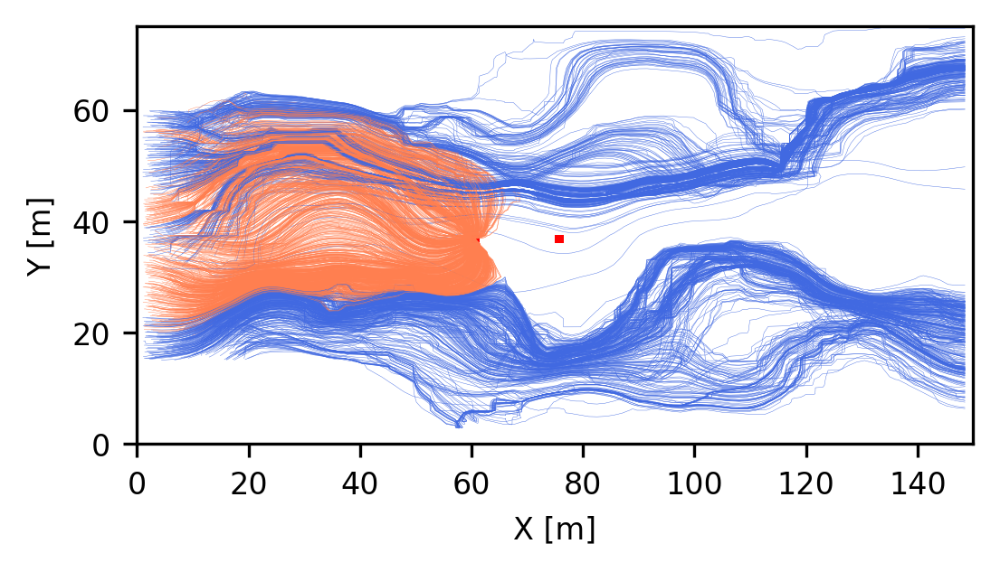

In [102]:
plt.figure(figsize=(5, 2), dpi=300)


ml = fp.plot.PlotMapView(model=gwf, layer=21)

for i in range(1, 2000):
    xmax = df_all.loc[df_all.irpt==i].iloc[-1].x
    path = df_all.loc[df_all.irpt == i]
    if xmax < 65:
        plt.plot(path["x"], path["y"], linewidth=.1, color="coral")
    else: 
        plt.plot(path["x"], path["y"], linewidth=.1, color="royalblue")

ml.plot_bc("WEL")
plt.xlabel("X [m]")
plt.ylabel("Y [m]")


In [103]:
t_well_aphe = []
t_bc_aphe = []
for i in range(1, 2000):
    xmax = df_all.loc[df_all.irpt==i].iloc[-1].x
    if xmax < 65:
        t_well_aphe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)
    else:
        t_bc_aphe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)

t_well_aphe = np.array(t_well_aphe)
t_bc_aphe = np.array(t_bc_aphe)
np.save("t_well_aphe.npy", t_well_aphe)
np.save("t_bc_aphe.npy", t_bc_aphe)

In [104]:
print(t_well_aphe.shape)
print(t_well_layhe.shape)

(1152,)
(1112,)


In [105]:
df_plot_well = pd.DataFrame([np.log10(t_well_aphe / 86400), np.log10(t_well_layhe / 86400)]).T
df_plot_well.columns = ["Ap-he", "Lay-he"]

df_plot_bc = pd.DataFrame([np.log10(t_bc_aphe / 86400), np.log10(t_bc_layhe / 86400)]).T
df_plot_bc.columns = ["Ap-he", "Lay-he"]

Text(0.5, 1.0, 'Downstream BC')

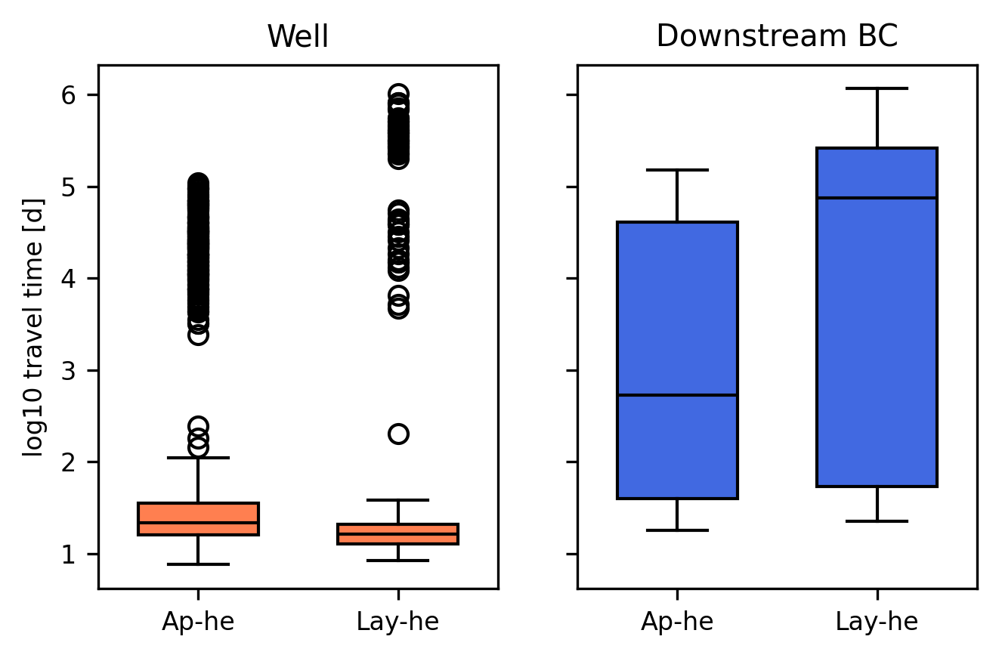

In [106]:
fig, ax= plt.subplots(1, 2, figsize=(5, 3), dpi=300, sharey=True)

axi = ax[0]
positions = [0, 1]
df_plot_well.plot.box(positions=positions, ax=axi, patch_artist=True, showfliers=True, widths=0.6,
                boxprops=dict(facecolor="coral"),
                whiskerprops=dict(color="black"),
                medianprops=dict(color="black"),
                capprops=dict(color="black"))
axi.set_ylabel("log10 travel time [d]")
axi.set_title("Well")

axi = ax[1]
positions = [0, 1]
df_plot_bc.plot.box(positions=positions, ax=axi, patch_artist=True, showfliers=True, widths=0.6,
                boxprops=dict(facecolor="royalblue"),
                whiskerprops=dict(color="black"),
                medianprops=dict(color="black"),
                capprops=dict(color="black"))

axi.set_title("Downstream BC")

In [107]:
import ArchPy.ap_mf

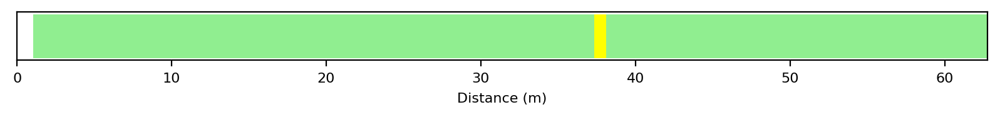

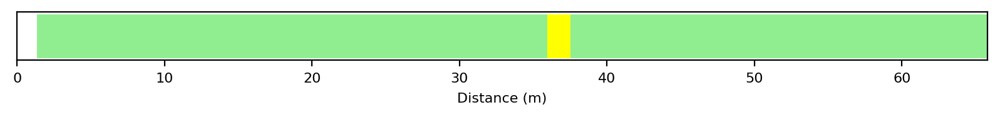

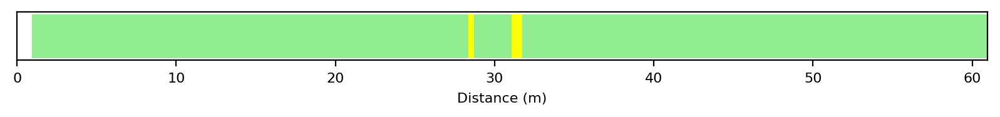

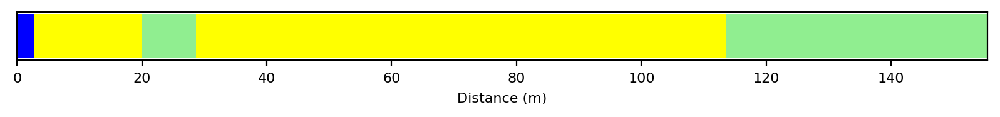

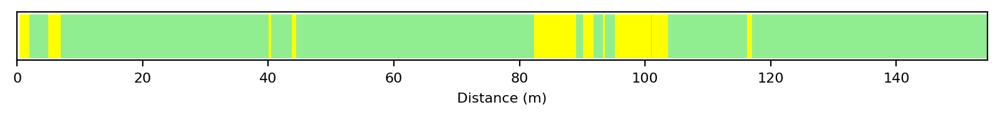

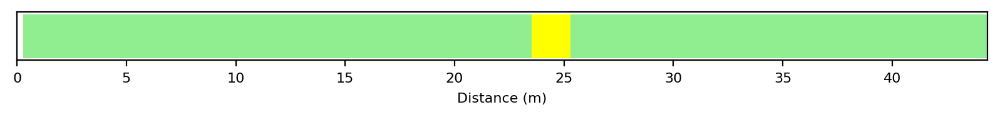

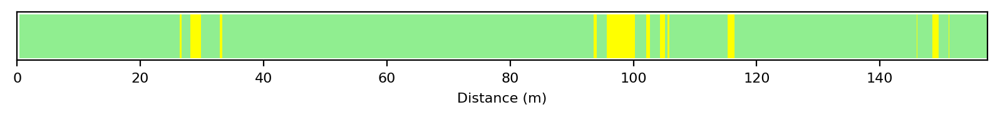

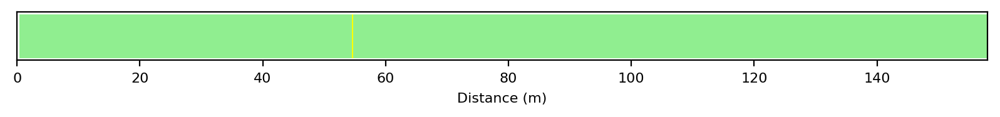

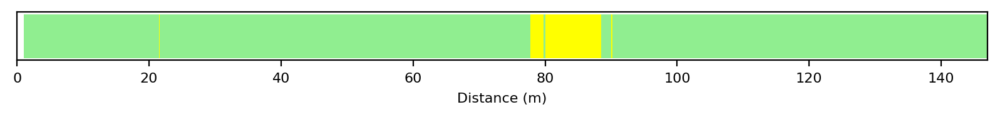

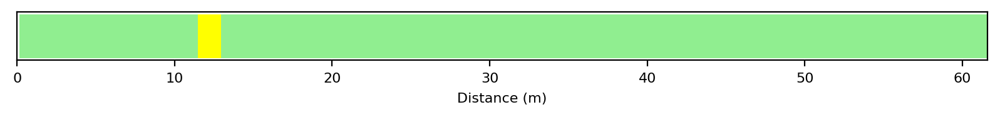

In [108]:
np.random.seed(1312)
for i in range(10):
    ip = np.random.randint(2000)
    df_p = archpy_flow.prt_get_facies_path_particle(ip)
    ArchPy.ap_mf.plot_particle_facies_sequence(T1, df=df_p, plot_distance=True, proportions=False, plot_time=False)

In [109]:
df_all = archpy_flow.prt_get_pathlines()
df = df_all.loc[df_all.irpt==1639]
df

,irpt,icell,kper,kstp,imdl,iprp,ilay,izone,istatus,ireason,trelease,t,x,y,z,name
207133,1639,112011,1,1,1,1,23,0,1,0,0.0,0.000000e+00,15.032296,43.731413,-10.856335,NaN
207134,1639,112011,1,1,1,1,23,0,1,1,0.0,6.952132e+03,15.272026,43.896049,-10.800000,NaN
207135,1639,107011,1,1,1,1,22,0,1,1,0.0,2.720498e+04,15.999072,44.405281,-10.650000,NaN
207136,1639,102011,1,1,1,1,21,0,1,1,0.0,4.060122e+04,16.500000,44.755302,-10.560089,NaN
207137,1639,102012,1,1,1,1,21,0,1,1,0.0,5.125454e+04,16.901001,45.000000,-10.535387,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207204,1639,92540,1,1,1,1,19,0,1,1,0.0,1.414964e+06,60.000000,36.949094,-10.257452,NaN
207205,1639,92541,1,1,1,1,19,0,1,1,0.0,1.415138e+06,60.056596,36.931343,-10.350000,NaN
207206,1639,97541,1,1,1,1,20,0,1,1,0.0,1.415367e+06,60.135468,36.906269,-10.500000,NaN
207207,1639,102541,1,1,1,1,21,0,1,1,0.0,1.415547e+06,60.200841,36.885159,-10.650000,NaN


In [110]:
np.random.seed(15)

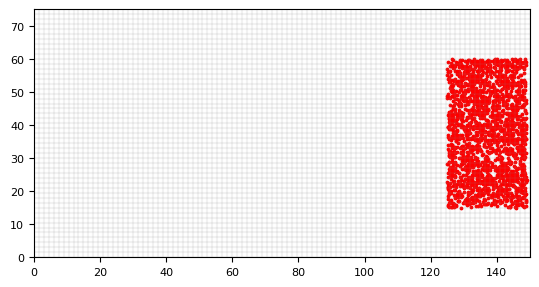

In [111]:
n = 2000
xp = np.random.uniform(125, 149, n)
yp = np.random.uniform(T1.yg[-1]*0.2 + T1.yg[0], T1.yg[-1]*0.8, n)
zp = np.random.uniform(-9, -11, n)
list_p_coords = []
for i in range(n):
    list_p_coords.append((xp[i], yp[i], zp[i]))
plt.scatter(xp, yp, c="red", s=3)
gwf.modelgrid.plot(alpha=.1)

In [112]:
archpy_flow.prt_create(prt_name="test_prt", workspace="ws_prt", trackdir="backward", list_p_coords=list_p_coords)
archpy_flow.set_porosity(prop_key="Porosity", iu=0, ifa=0, ip=0)
archpy_flow.prt_run(silent=False)

c:\Users\schorppl\.conda\envs\archpy_work\Lib\site-packages\flopy\utils\gridintersect.py:123: DeprecationWarning: Note `method="structured"` is deprecated. Pass `method="vertex"` to silence this warning. This will be the new default in a future release and this keyword argument will be removed.
  warnings.warn(


writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ems...
  writing model test_prt...
    writing model name file...
    writing package mip...
    writing package dis...
    writing package prp...
    writing package oc...
    writing package fmi...
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.6.1 02/10/2025

   MODFLOW 6 compiled Feb 14 2025 13:40:10 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to furt

In [113]:
df_all = archpy_flow.prt_get_pathlines()

Text(0, 0.5, 'Y [m]')

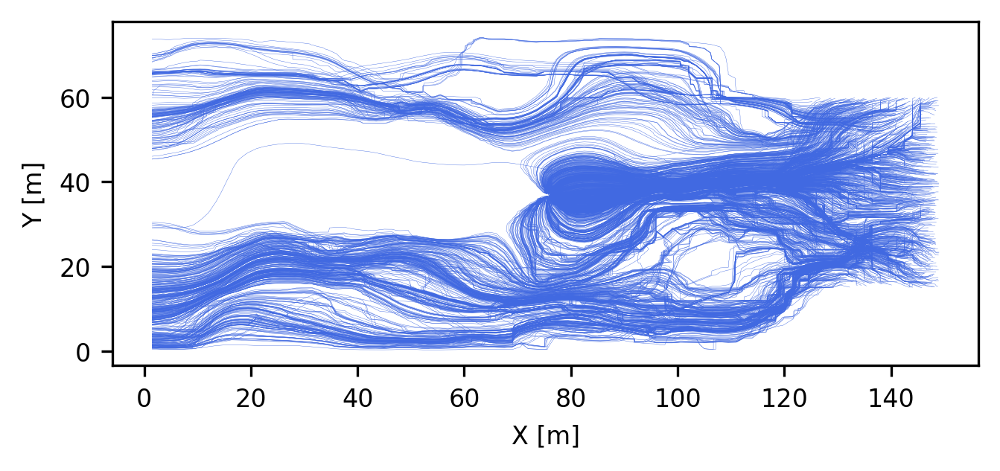

In [114]:
plt.figure(figsize=(5, 2), dpi=300)

# gwf.modelgrid.plot(alpha=.1)
for i in range(1, 2000):
    path = df_all.loc[df_all.irpt == i]
    plt.plot(path["x"], path["y"], linewidth=.1, color="royalblue")

plt.xlabel("X [m]")
plt.ylabel("Y [m]")

In [115]:
self = archpy_flow

In [116]:
sim_dir = self.sim_prt.sim_path
csv_name = self.sim_prt.prt[0].oc.trackcsv_filerecord.array[0][0]
csv_path = os.path.join(sim_dir, csv_name)
df = pd.read_csv(csv_path)
df = df.loc[df.irpt==9]

In [117]:
time_ordered = df["t"].values.copy()
time_ordered *= 1/86400
dt = np.diff(time_ordered)

# add a column to track distance traveled
distances = ((df[["x", "y", "z"]].iloc[1:].values - df[["x", "y", "z"]].iloc[:-1].values)**2).sum(1)**0.5

# store everything in a new dataframe
df_all = pd.DataFrame(columns=["dt", "time", "distance", "cum_distance", "x", "y", "z"])
df_all["dt"] = dt
df_all["time"] = time_ordered[1:]
df_all["distance"] = distances
df_all["cum_distance"] = df_all["distance"].cumsum()
df_all["x"] = df["x"].values[1:]
df_all["y"] = df["y"].values[1:]
df_all["z"] = df["z"].values[1:]

In [118]:
nx = self.get_gwf().modelgrid.ncol
ny = self.get_gwf().modelgrid.nrow
cells_path = ArchPy.ap_mf.get_locs(df.icell-1, nx, ny)
cells_path = np.array(cells_path)[1:]

# check that no cells path exceed the grid
cells_path[:, 0][cells_path[:, 0] >= self.T1.nz] = self.T1.nz - 1
cells_path[:, 1][cells_path[:, 1] >= self.T1.ny] = self.T1.ny - 1
cells_path[:, 2][cells_path[:, 2] >= self.T1.nx] = self.T1.nx - 1

In [119]:
facies = self.T1.get_facies(0, 0, all_data=False)
facies = np.flip(np.flipud(facies), axis=1)

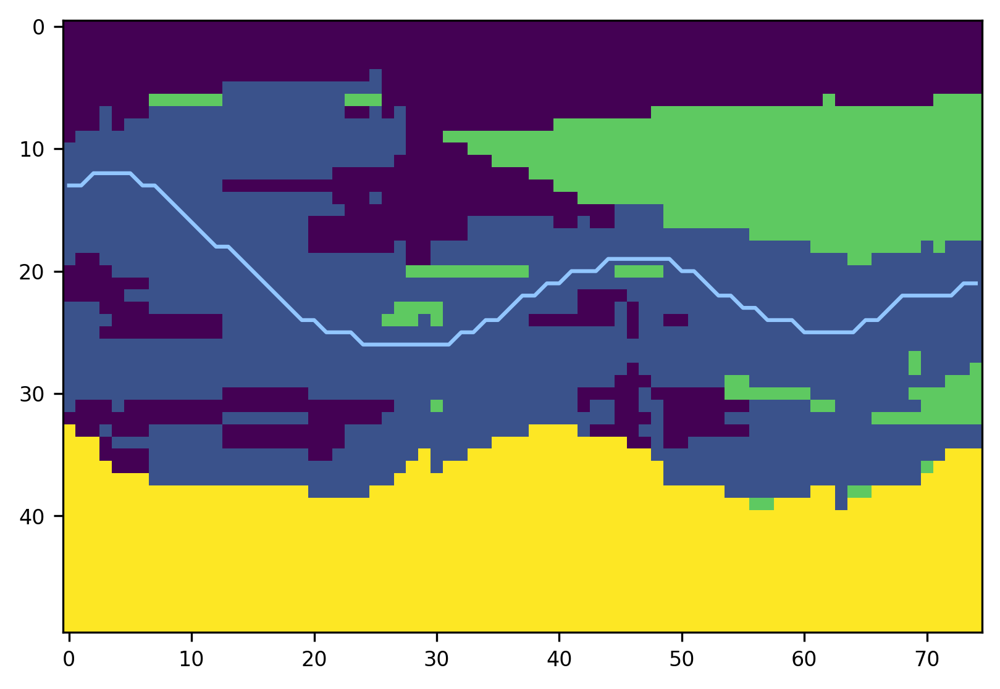

In [120]:
plt.figure(dpi=300)
plt.imshow(facies[:, cells_path[:, 1], cells_path[:, 2]], vmin=1, vmax=5)
plt.plot(cells_path[:, 0])

## NR-heterogeneous mode

In [215]:
archpy_flow = archpy2modflow(T1, exe_name=mf6_exe_path, model_dir="new_res_hetero")  # create the modflow model
archpy_flow.create_sim(grid_mode="new_resolution", iu=0, unit_limit=None, factor_x=4, factor_y=2, factor_z=2)  # create the simulation object and choose a certain discretization
archpy_flow.set_k("K", iu=0, ifa=0, ip=0, log=True)  # set the hydraulic conductivity

Simulation created with the following parameters:
Grid mode: new_resolution
To retrieve the simulation, use the get_sim() method


In [216]:
from ArchPy.uppy import upscale_k, rotate_point 

self = archpy_flow
prop_key = "K"
iu = 0
ifa = 0
ip = 0
log = True
from ArchPy.uppy import upscale_k


prop = self.T1.get_prop(prop_key)[iu, ifa, ip]
prop = np.flip(np.flipud(prop), axis=1)  # flip the array to have the same orientation as the ArchPy table
if log:
    prop = 10**prop
new_prop, _, _ = upscale_k(prop, method="simplified_renormalization",
                        dx=self.T1.get_sx(), dy=self.T1.get_sy(), dz=self.T1.get_sz(),
                        factor_x=self.factor_x, factor_y=self.factor_y, factor_z=self.factor_z)

# fill nan values
# new_prop[np.isnan(new_prop)] = np.nanmean(new_prop)

In [217]:
new_prop

array([[[8.32609353e-05, 2.71230057e-04, 4.24658011e-04, ...,
         5.73240807e-04, 6.93446533e-04, 1.29933221e-03],
        [1.44450787e-04, 4.17324564e-04, 4.96956819e-04, ...,
         2.33076627e-04, 3.97862842e-04, 9.86264710e-04],
        [2.31615460e-04, 6.19503471e-04, 6.75846878e-04, ...,
         1.12077139e-04, 2.53304313e-04, 6.24695883e-04],
        ...,
        [3.94693125e-04, 2.29263461e-04, 7.92197847e-05, ...,
         1.33543271e-03, 7.16278293e-04, 1.71205073e-04],
        [3.58655216e-04, 4.03808104e-04, 1.47935676e-04, ...,
         1.85078066e-03, 1.18666428e-03, 1.91316906e-04],
        [2.58671573e-04, 5.56179840e-04, 4.42109625e-04, ...,
         2.20347060e-03, 1.13817022e-03, 1.75655270e-04]],

       [[7.48763759e-05, 2.40885570e-04, 4.25562931e-04, ...,
         5.67331673e-04, 6.67760724e-04, 1.19102848e-03],
        [7.56787934e-05, 2.58930989e-04, 3.41639996e-04, ...,
         2.32346654e-04, 3.59904216e-04, 8.96483010e-04],
        [5.15365293e-05, 

In [202]:
sim = archpy_flow.get_sim()
gwf = archpy_flow.get_gwf()

In [203]:
gwf.modelgrid.nlay * gwf.modelgrid.nrow * gwf.modelgrid.ncol

15625

In [204]:
sim.ims.remove()
inner_dvclose = 1e-5
ims = fp.mf6.ModflowIms(sim, complexity="moderate", inner_dvclose=inner_dvclose)

In [205]:
# add BC at left and right on all layers
h1 = .3
h2 = 0
T_1 = 10  # temperature at left boundary
T_2 = 10  # temperature at right boundary
chd_data = []

a = np.zeros((gwf.modelgrid.nlay, gwf.modelgrid.nrow, gwf.modelgrid.ncol), dtype=bool)
a[:, :, 0] = 1
lst_chd = array2cellids(a, gwf.dis.idomain.array)
for cellid in lst_chd:
    chd_data.append((cellid, h1, T_1))

chd1 = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_data, save_flows=True, auxiliary="TEMPERATURE", pname="CHD-1")

chd_data = []
a = np.zeros((gwf.modelgrid.nlay, gwf.modelgrid.nrow, gwf.modelgrid.ncol), dtype=bool)
a[:, :, -1] = 1
lst_chd = array2cellids(a, gwf.dis.idomain.array)
for cellid in lst_chd:
    chd_data.append((cellid, h2, T_2))

chd2 = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_data, save_flows=True, auxiliary="TEMPERATURE", pname="CHD-2")

In [206]:
# add an injection well in the middle of the model
well_data = []
Q_well = 0.0015  # m3/s
T_well = 7  # temperature of the injected water
cellid_well = (int(21/50 *  gwf.dis.nlay.array), gwf.dis.nrow.array // 2, gwf.dis.ncol.array // 2)
well_data.append((cellid_well, Q_well, T_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, auxiliary="TEMPERATURE", pname="WEL-INJ")

# production well
well_data = []
Q_well = -Q_well # m3/s
cellid_well = (int(21/50 *  gwf.dis.nlay.array), gwf.dis.nrow.array // 2, int(gwf.dis.ncol.array // 2.5))
well_data.append((cellid_well, Q_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, pname="WEL-PROD")

In [127]:
sim.write_simulation()
sim.run_simulation()

writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ims_-1...
  writing model test...
    writing model name file...
    writing package dis...
    writing package ic...
    writing package oc...
    writing package npf...
    writing package chd-1...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 625 based on size of stress_period_data
    writing package chd-2...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 625 based on size of stress_period_data
    writing package wel-inj...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
    writing package wel-prod...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURV

(True, [])

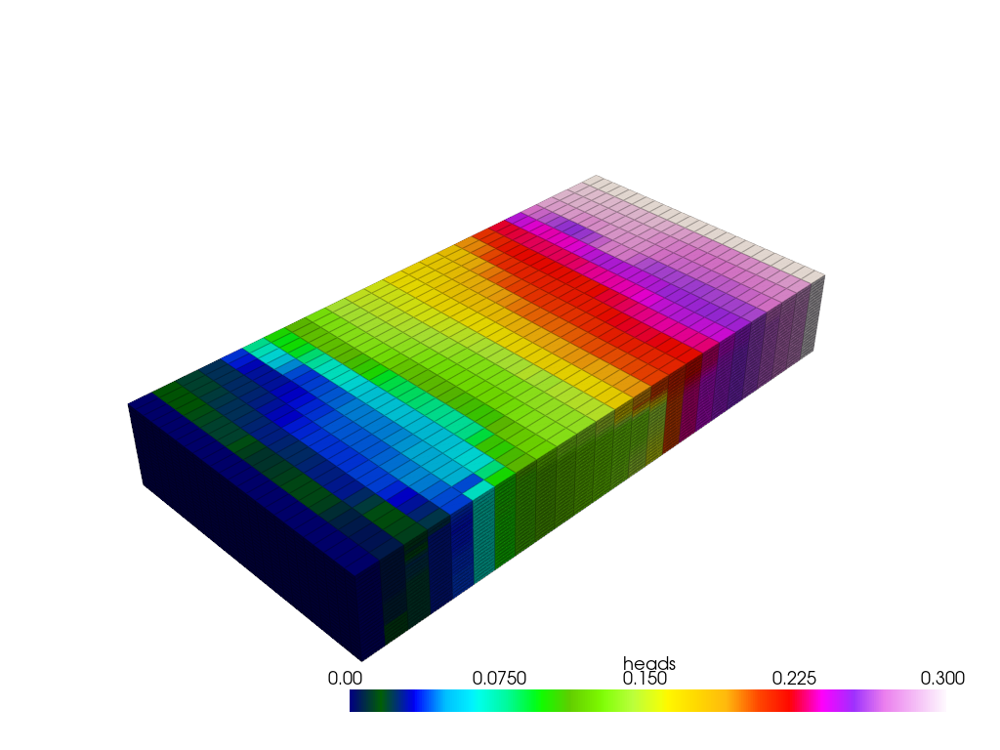

In [128]:
from flopy.export.vtk import Vtk

vert_exag = 3
vtk = Vtk(model=gwf, binary=False, vertical_exageration=vert_exag, smooth=True)
vtk.add_model(gwf)

heads = archpy_flow.get_heads()
vtk.add_array(heads, name="heads")
vtk.add_array(np.log10(gwf.npf.k.array), name="K")

gwf_mesh = vtk.to_pyvista()
ghosts = np.argwhere(gwf_mesh["idomain"] <= 0)
gwf_mesh.remove_cells(ghosts, inplace=True)

pl = pv.Plotter(notebook=True)
pl.add_mesh(gwf_mesh, opacity=1, show_edges=True, scalars="heads", cmap="gist_ncar", edge_opacity=0.3, clim=[0, 0.3])
# pl.show(screenshot="E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_NR_he.png", window_size=[1300, 900], auto_close=False)

pl.show()

In [129]:
heads = archpy_flow.get_heads()

Text(0, 0.5, 'Z [m]')

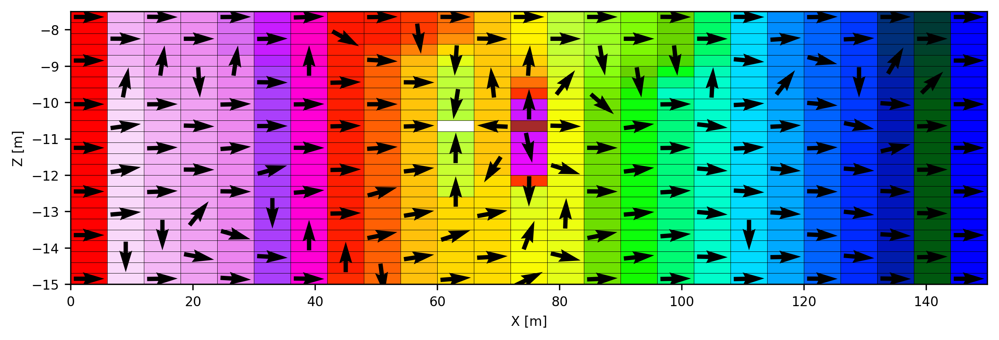

In [130]:
cobj = gwf.output.budget()
qx, qy, qz = fp.utils.postprocessing.get_specific_discharge(
        cobj.get_data(text="DATA-SPDIS", kstpkper=(0, 0))[0], gwf)

# plot cross section
from flopy.plot import PlotCrossSection
fig, ax = plt.subplots(1, 1, figsize=(10, 3), dpi=300)
cross_section = PlotCrossSection(model=gwf, line={"row": 12})
# cross_section.plot_array(np.log10(gwf.npf.k.array), cmap="Blues", ax=ax)
cross_section.plot_array(heads, cmap="gist_ncar", ax=ax)
cross_section.plot_bc("CHD-1", color="red", ax=ax)
cross_section.plot_bc("CHD-2", color="blue", ax=ax)
cross_section.plot_bc("WEL-INJ", color="brown", ax=ax)
cross_section.plot_bc("WEL-PROD", color="white", ax=ax)
cross_section.plot_vector(qx, qy, qz, color="black", normalize=True, kstep=2, hstep=2, ax=ax, scale=30)
cross_section.plot_grid(linewidth=0.2, color="black")
# fig.savefig("E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_NR_he_cross_section.png", dpi=300, bbox_inches="tight")
plt.xlabel("X [m]")
plt.ylabel("Z [m]")

In [131]:
np.random.seed(15)

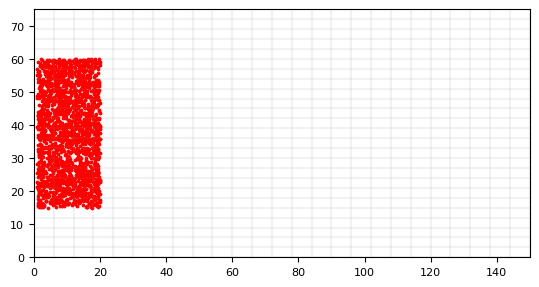

In [132]:
n = 2000
xp = np.random.uniform(1, 20, n)
yp = np.random.uniform(T1.yg[-1]*0.2 + T1.yg[0], T1.yg[-1]*0.8, n)
zp = np.random.uniform(-9, -11, n)
list_p_coords = []
for i in range(n):
    list_p_coords.append((xp[i], yp[i], zp[i]))
plt.scatter(xp, yp, c="red", s=3)
gwf.modelgrid.plot(alpha=.1)

In [133]:
archpy_flow.prt_create(prt_name="test_prt", workspace="ws_prt", trackdir="forward", list_p_coords=list_p_coords)
archpy_flow.set_porosity(prop_key="Porosity", iu=0, ifa=0, ip=0)
archpy_flow.prt_run(silent=False)

c:\Users\schorppl\.conda\envs\archpy_work\Lib\site-packages\flopy\utils\gridintersect.py:123: DeprecationWarning: Note `method="structured"` is deprecated. Pass `method="vertex"` to silence this warning. This will be the new default in a future release and this keyword argument will be removed.
  warnings.warn(


writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ems...
  writing model test_prt...
    writing model name file...
    writing package mip...
    writing package dis...
    writing package prp...
    writing package oc...
    writing package fmi...
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.6.1 02/10/2025

   MODFLOW 6 compiled Feb 14 2025 13:40:10 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to furt

In [134]:
df_all = archpy_flow.prt_get_pathlines()

In [135]:
t_well_layhe = []
t_bc_layhe = []
for i in range(1, 2000):
    xmax = df_all.loc[df_all.irpt==i].iloc[-1].x
    if xmax < 65:
        t_well_layhe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)
    else:
        t_bc_layhe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)

t_well_layhe = np.array(t_well_layhe)
t_bc_layhe = np.array(t_bc_layhe)
np.save("t_well_nrhe.npy", t_well_layhe)
np.save("t_bc_nrhe.npy", t_bc_layhe)

## Modflow grid mode heterogeneous

Create a refined grid

In [235]:
import flopy
from flopy.utils.gridgen import Gridgen
from flopy.export.vtk import Vtk

gridgen_path = "../../../../exe/gridgen.exe"

In [236]:
nlay = 10
nrow = 26
ncol = 40
Lx = 150
Ly = 75
delr = Lx / ncol
delc = Ly / nrow
top = -7.5

ox = 0
oy = 0
oz = -15
dz = (oz - top) / nlay
botm = np.linspace(top + dz, oz, nlay)

sim = flopy.mf6.MFSimulation(
    sim_name="asdf", sim_ws="ws", exe_name="mf6")
tdis = flopy.mf6.ModflowTdis(sim, time_units="DAYS", perioddata=[[1.0, 1, 1.0]])
ms = flopy.mf6.ModflowGwf(sim, modelname="asdf", save_flows=True)
dis = flopy.mf6.ModflowGwfdis(
    ms,
    nlay=nlay,
    nrow=nrow,
    ncol=ncol,
    delr=delr,
    delc=delc,
    top=top,
    botm=botm,
    xorigin=0,  # gridgen will be applied on a grid with origin at 0, 0
    yorigin=0,
)

# create Gridgen object
g = Gridgen(ms.modelgrid, model_ws="gridgen_ws", exe_name=gridgen_path) 

well1_coord = (T1.xg[T1.nx // 2], T1.yg[T1.ny // 2])
well2_coord = (T1.xg[int(T1.nx // 2.5)], T1.yg[T1.ny // 2])
points = [well1_coord, well2_coord]
g.add_refinement_features(points, "point", 3, range(nlay))
refshp0 = "gridgen_ws/" + "rf0"

polygon = [
    [
        (50, 30),
        (50, 45),
        (80, 45),
        (80, 30),
        (50, 30),
    ]
]
polygon = np.array(polygon)
g.add_refinement_features([polygon], "polygon", 1, range(nlay))


In [237]:
g.build(verbose=False)

Text(0.5, 0, 'X [m]')

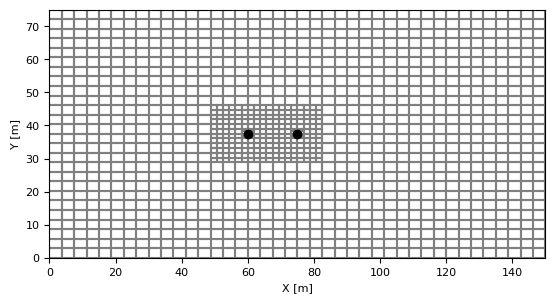

In [238]:
%matplotlib inline

ms.dis.remove()
disv_gridprops = g.get_gridprops_disv()
disv = flopy.mf6.ModflowGwfdisv(ms, **disv_gridprops, xorigin=ox, yorigin=oy, angrot=0)  # create grid this time with the origin at ox, oy
# disu = flopy.mf6.ModflowGwfdisu(ms, **g.get_gridprops_disu6(), xorigin=ox, yorigin=oy, angrot=0)  # create grid this time with the origin at ox, oy

grid = ms.modelgrid
grid.plot(alpha=1, zorder=0)

plt.scatter(T1.xg[T1.nx // 2], T1.yg[T1.ny // 2], zorder=1, color="k")
plt.scatter(T1.xg[int(T1.nx // 2.5)], T1.yg[T1.ny // 2], zorder=1, color="k")

plt.ylabel("Y [m]")
plt.xlabel("X [m]")
# plt.ylim(0, 220)
# plt.xlim(-100, 220)

In [239]:
plt.close()

In [295]:
grid.nlay * grid.ncpl

12500

In [321]:
import ArchPy.ap_mf

In [322]:
archpy_flow = archpy2modflow(T1, exe_name=mf6_exe_path, model_dir="modflow_grid_hetero")  # create the modflow model
archpy_flow.create_sim(grid_mode="disv", iu=0, unit_limit=None, modflowgrid_props=g.get_gridprops_disv())  # create the simulation object and choose a certain discretization

Simulation created with the following parameters:
Grid mode: disv
To retrieve the simulation, use the get_sim() method


In [323]:
archpy_flow.set_k("K", iu=0, ifa=0, ip=0, log=True, xt3doptions=None, average_facies=False)  # set the hydraulic conductivity

In [324]:
from ArchPy.uppy import upscale_k, rotate_point 

prop_key = "K"
iu = 0
ifa = 0
ip = 0
log = True

self = archpy_flow
dx, dy, dz = self.T1.get_sx(), self.T1.get_sy(), self.T1.get_sz()
ox, oy, oz = self.T1.get_ox(), self.T1.get_oy(), self.T1.get_oz()   

prop = self.T1.get_prop(prop_key)[iu, ifa, ip]
prop = np.flip(np.flipud(prop), axis=1)  # flip the array to have the same orientation as the ArchPy table
if log:
    prop = 10**prop

# get the grid object --> needs to be rotated
import copy
grid = self.get_gwf().modelgrid
grid = copy.deepcopy(grid)  # create a copy of the grid to avoid modifying the original one

# rotate grid around the origin of archpy model

# retrieve origin of the new grid and archpy grid as well as the rotation angle 
xorigin, yorigin = grid.xoffset, grid.yoffset
ox_grid, oy_grid = self.T1.get_ox(), self.T1.get_oy()
angrot = self.T1.get_rot_angle()
xorigin_rot, yorigin_rot = rotate_point((xorigin, yorigin), origin=(ox_grid, oy_grid), angle=-angrot) 

# rotation
grid.set_coord_info(xoff=xorigin_rot, yoff=yorigin_rot, angrot=-angrot)

# upscale
new_prop, _, _ = upscale_k(prop, method="simplified_renormalization",
                        dx=dx, dy=dy, dz=dz, ox=ox, oy=oy, oz=oz,
                        factor_x=self.factor_x, factor_y=self.factor_y, factor_z=self.factor_z,
                        grid=grid)

In [325]:
new_prop

array([[3.98672307e-05, 8.22338251e-05, 1.72688092e-04, ...,
        1.32653138e-03, 3.75687437e-04, 1.15189312e-04],
       [6.10583493e-09, 5.54328232e-09, 7.70320178e-09, ...,
        1.22436430e-03, 3.29869742e-04, 9.84170149e-05],
       [5.29816650e-09, 1.72517872e-08, 3.46159653e-03, ...,
        6.48656473e-04, 1.83651249e-04, 5.49448734e-05],
       ...,
       [1.00000001e-10, 2.61000687e-10, 3.96177158e-03, ...,
        1.00000001e-10, 1.00000001e-10, 2.81229256e-10],
       [1.00000001e-10, 1.00000001e-10, 1.61256148e-10, ...,
        1.00000001e-10, 1.00000001e-10, 1.00000001e-10],
       [1.00000001e-10, 1.00000001e-10, 1.00000001e-10, ...,
        1.00000001e-10, 1.00000001e-10, 1.00000001e-10]])

In [326]:
sim = archpy_flow.get_sim()
gwf = archpy_flow.get_gwf()

In [327]:
from shapely.geometry import LineString

p = np.array([(0, 0), (0, 75),
 (150, 0),
 (150, 75)])

l1 = LineString([p[0], p[1]])
l2 = LineString([p[2], p[3]])

ix = fp.utils.gridintersect.GridIntersect(mfgrid=grid)

cid1 = ix.intersects(l1).cellids
cid2 = ix.intersects(l2).cellids
h1 = 0.3
h2 = 0

# create the bc (chd package on each layers)
chd_lst = []
for ilay in range(nlay):
    chd_lst += [((ilay, id1), h1) for id1 in cid1]
for ilay in range(nlay):
    chd_lst += [((ilay, id2), h2) for id2 in cid2]

chd = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_lst, save_flows=True, pname="CHD")

In [328]:
well1_coord = (T1.xg[T1.nx // 2], T1.yg[T1.ny // 2], T1.zg[50-21])
well2_coord = (T1.xg[int(T1.nx // 2.5)], T1.yg[T1.ny // 2], T1.zg[50-21])

# add an injection well in the middle of the model
well_data = []
Q_well = 0.0015  # m3/s
T_well = 7  # temperature of the injected water
cellid_well = gwf.modelgrid.intersect(*well1_coord)
well_data.append((cellid_well, Q_well, T_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, auxiliary="TEMPERATURE", pname="WEL-INJ")

# production well
well_data = []
Q_well = -Q_well # m3/s
cellid_well = gwf.modelgrid.intersect(*well2_coord)
well_data.append((cellid_well, Q_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, pname="WEL-PROD")

In [329]:
gwf.ic.strt.set_data(0.15)

In [330]:
sim.ims.remove()
inner_dvclose = 1e-5
ims = fp.mf6.ModflowIms(sim, complexity="moderate", inner_dvclose=inner_dvclose)

In [331]:
sim.write_simulation()
sim.run_simulation()

writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ims_-1...
  writing model test...
    writing model name file...
    writing package disv...
    writing package ic...
    writing package oc...
    writing package npf...
    writing package chd...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 520 based on size of stress_period_data
    writing package wel-inj...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
    writing package wel-prod...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.6.1 02/10/2025

   MODFLOW 6 compiled Feb 14 2025 13:40:10 with Intel(

(True, [])

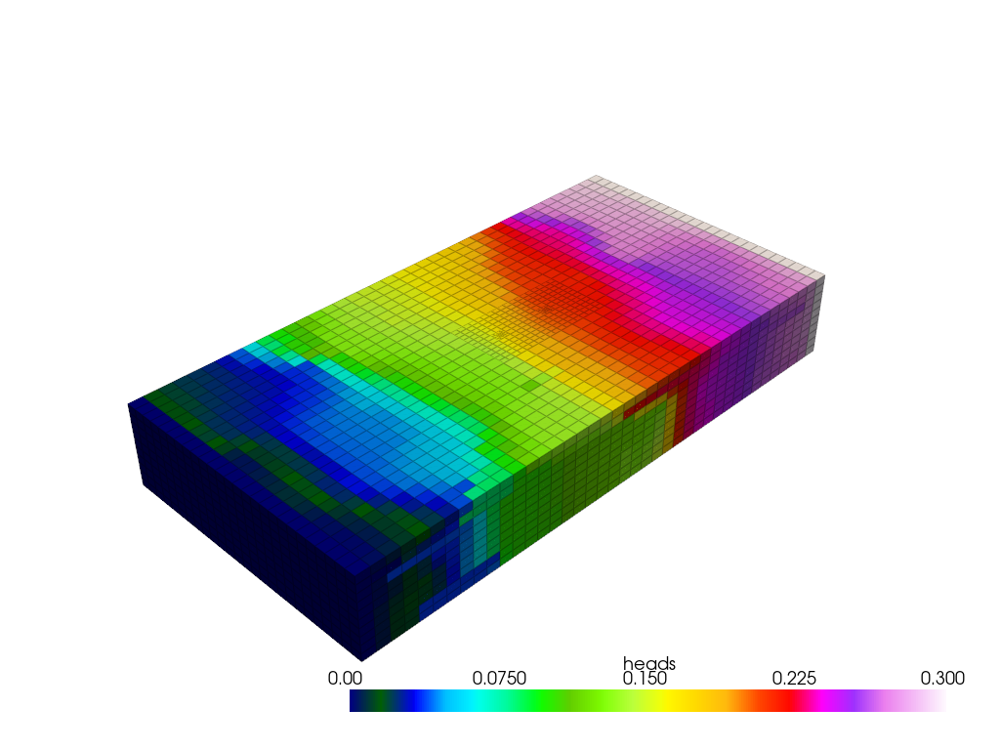

In [332]:
from flopy.export.vtk import Vtk

vert_exag = 3
vtk = Vtk(model=gwf, binary=False, vertical_exageration=vert_exag, smooth=True)
vtk.add_model(gwf)

heads = archpy_flow.get_heads()
vtk.add_array(heads, name="heads")
vtk.add_array(np.log10(gwf.npf.k.array), name="K")

gwf_mesh = vtk.to_pyvista()

pl = pv.Plotter(notebook=True)

pl.add_mesh(gwf_mesh, opacity=1, show_edges=True, scalars="heads", cmap="gist_ncar", edge_opacity=0.3, clim=[0, 0.3])
# pl.show(screenshot="E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_mg_he.png", window_size=[1300, 900], auto_close=False)

pl.show()

In [333]:
heads = archpy_flow.get_heads()

In [334]:
plt.close()

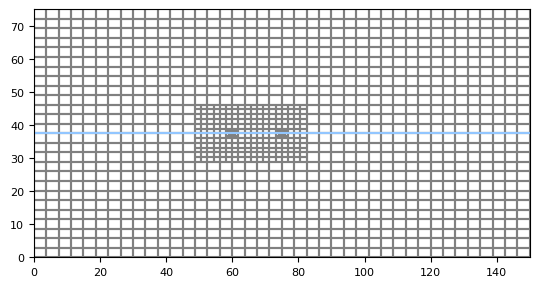

In [335]:
grid.plot()
plt.plot((0, 150), (37.5, 37.5))

Text(0, 0.5, 'Z [m]')

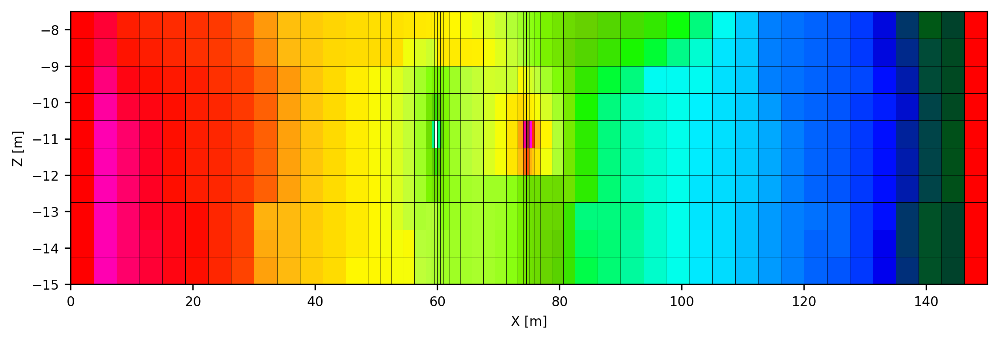

In [347]:
%matplotlib inline
cobj = gwf.output.budget()
qx, qy, qz = fp.utils.postprocessing.get_specific_discharge(
        cobj.get_data(text="DATA-SPDIS", kstpkper=(0, 0))[0], gwf)

# plot cross section
from flopy.plot import PlotCrossSection
fig, ax = plt.subplots(1, 1, figsize=(10, 3), dpi=300)
cross_section = PlotCrossSection(model=gwf, line={"line": ((0, 37.5), (150, 37.5))})
# cross_section.plot_array(np.log10(gwf.npf.k.array), cmap="Blues", ax=ax)
g = cross_section.plot_array(heads, cmap="gist_ncar", ax=ax)
# plt.colorbar(g)
cross_section.plot_bc("CHD", color="red", ax=ax)
# cross_section.plot_bc("CHD-2", color="blue", ax=ax)
cross_section.plot_bc("WEL-INJ", color="brown", ax=ax)
cross_section.plot_bc("WEL-PROD", color="white", ax=ax)
# cross_section.plot_vector(qx, qy, qz, color="black", normalize=True, kstep=2, hstep=2, ax=ax, scale=30)
cross_section.plot_grid(linewidth=0.2, color="black")

plt.xlabel("X [m]")
plt.ylabel("Z [m]")
# fig.savefig("E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_mg_he_cross_section.png", dpi=300, bbox_inches="tight")
# fig.savefig("../../../figures/articles/archpy 2/raw/archpy_he_cross_section.png", dpi=300, bbox_inches="tight")

In [337]:
np.random.seed(15)

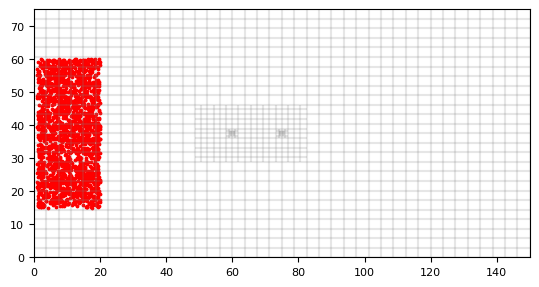

In [338]:
n = 2000
xp = np.random.uniform(1, 20, n)
yp = np.random.uniform(T1.yg[-1]*0.2 + T1.yg[0], T1.yg[-1]*0.8, n)
zp = np.random.uniform(-9, -11, n)
list_p_coords = []
for i in range(n):
    list_p_coords.append((xp[i], yp[i], zp[i]))
plt.scatter(xp, yp, c="red", s=3)
gwf.modelgrid.plot(alpha=.1)

In [339]:
archpy_flow.prt_create(prt_name="test_prt", workspace="ws_prt", trackdir="forward", list_p_coords=list_p_coords)
archpy_flow.set_porosity(prop_key="Porosity", iu=0, ifa=0, ip=0)


In [341]:
archpy_flow.prt_run(silent=False)

writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ems...
  writing model test_prt...
    writing model name file...
    writing package mip...
    writing package disv...
    writing package prp...
    writing package oc...
    writing package fmi...
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.6.1 02/10/2025

   MODFLOW 6 compiled Feb 14 2025 13:40:10 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to fur

In [342]:
df_all = archpy_flow.prt_get_pathlines()

In [343]:
df_all

,irpt,icell,kper,kstp,imdl,iprp,ilay,izone,istatus,ireason,trelease,t,x,y,z,name
0,1,4115,1,1,1,1,4,0,1,0,0.0,0.000000e+00,17.127536,48.665238,-9.800428,NaN
1,1,4115,1,1,1,1,4,0,1,1,0.0,1.946292e+04,17.580640,49.038462,-9.801964,NaN
2,1,4075,1,1,1,1,4,0,1,1,0.0,7.395227e+04,18.750000,49.992895,-9.807179,NaN
3,1,4076,1,1,1,1,4,0,1,1,0.0,1.544397e+05,20.776522,51.923077,-9.791246,NaN
4,1,4036,1,1,1,1,4,0,1,1,0.0,1.608076e+05,21.038229,52.078040,-9.750000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86266,2000,4404,1,1,1,1,4,0,1,1,0.0,1.835883e+06,59.811539,36.418269,-10.252202,NaN
86267,2000,4402,1,1,1,1,4,0,1,1,0.0,1.838227e+06,59.782036,37.038885,-10.500000,NaN
86268,2000,5652,1,1,1,1,5,0,1,1,0.0,1.838288e+06,59.779966,37.139423,-10.517396,NaN
86269,2000,5565,1,1,1,1,5,0,5,3,0.0,1.838409e+06,59.773957,37.500000,-10.599283,NaN


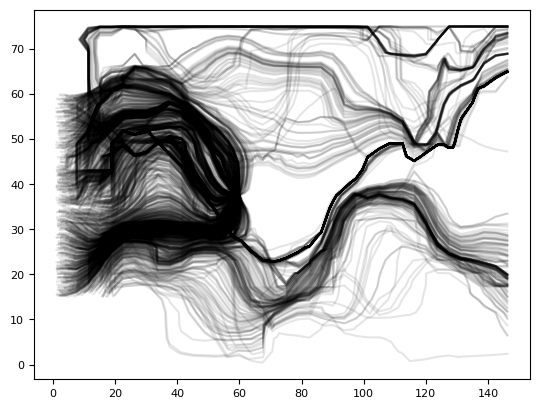

In [344]:
for i in range(1, 2000):
    df_i = df_all.loc[df_all.irpt==i]
    plt.plot(df_i.x, df_i.y, color="black", alpha=0.1)

In [345]:
t_well_layhe = []
t_bc_layhe = []
for i in range(1, 2000):
    xmax = df_all.loc[df_all.irpt==i].iloc[-1].x
    if xmax < 65:
        t_well_layhe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)
    else:
        t_bc_layhe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)

t_well_layhe = np.array(t_well_layhe)
t_bc_layhe = np.array(t_bc_layhe)
np.save("t_well_mghe.npy", t_well_layhe)
np.save("t_bc_mghe.npy", t_bc_layhe)

## ArchPy mode - homogeneous

Re make an archpy model but assuming each layer completely homogeneous.

In [348]:
## create pile

P1 = Pile(name = "P1",seed=1)

#units covmodel
covmodelD = gcm.CovModel2D(elem=[('cubic', {'w':0.6, 'r':[30,30]})])
covmodelD1 = gcm.CovModel2D(elem=[('cubic', {'w':0.2, 'r':[30,30]})])
covmodelC = gcm.CovModel2D(elem=[('cubic', {'w':0.2, 'r':[40,40]})])
covmodelB = gcm.CovModel2D(elem=[('cubic', {'w':0.6, 'r':[30,30]})])
covmodel_er = gcm.CovModel2D(elem=[('spherical', {'w':1, 'r':[50,50]})])


#create Lithologies 
dic_s_D = {"int_method" : "grf_ineq","covmodel" : covmodelD}
dic_f_D = {"f_method":"homogenous"}
D = Unit(name="D",order=1,ID = 1,color="gold",contact="onlap",surface=Surface(contact="onlap",dic_surf=dic_s_D)
         ,dic_facies=dic_f_D)

dic_s_C = {"int_method" : "grf_ineq","covmodel" : covmodelC, "mean":-8.5}
dic_f_C = {"f_method":"homogenous"}
C = Unit(name="C", order=2, ID = 2, color="blue", contact="onlap", dic_facies=dic_f_C, surface=Surface(dic_surf=dic_s_C, contact="onlap"))

dic_s_B = {"int_method" : "grf_ineq","covmodel" : covmodelB, "mean":-9.5}
dic_f_B = {"f_method":"homogenous"}
B = Unit(name="B",order=3,ID = 3,color="purple",contact="onlap",dic_facies=dic_f_B,surface=Surface(contact="onlap",dic_surf=dic_s_B))

dic_s_A = {"int_method":"grf_ineq","covmodel": covmodelB, "mean":-13}
dic_f_A = {"f_method":"homogenous"}
A = Unit(name="A",order=4, ID = 4,color="red",contact="onlap",dic_facies=dic_f_A,surface=Surface(dic_surf = dic_s_A,contact="onlap"))

#Master pile
P1.add_unit([D,C,B,A])

# covmodels for the property model
covmodelK = gcm.CovModel3D(elem=[("exponential",{"w":0.3,"r":[30,30,10]})],alpha=-20,name="K_vario")
covmodelK2 = gcm.CovModel3D(elem=[("spherical",{"w":0.1,"r":[20,20, 5]})],alpha=0,name="K_vario_2")

facies_1 = Facies(ID = 1,name="Sand",color="yellow")
facies_2 = Facies(ID = 2,name="Gravel",color="lightgreen")
facies_4 = Facies(ID = 4,name="Clay",color="blue")
facies_7 = Facies(ID = 7,name="basement",color="red")

A.add_facies([facies_7])
B.add_facies([facies_2])
D.add_facies([facies_1])
C.add_facies([facies_4])

# property model

# K
# cm_prop1 = gcm.CovModel3D(elem = [("spherical", {"w":0.5, "r":[10, 10, 10]}),
#                                   ("cubic", {"w":0.5, "r":[15, 15, 15]})])
cm_prop2 = gcm.CovModel3D(elem = [("cubic", {"w":0.25, "r":[25, 25, 25]})])

list_facies = [facies_1, facies_2, facies_4, facies_7]
means = [-4, -2.3, -8, -10]
prop_model = ArchPy.base.Prop("K",
                              facies = list_facies,
                              covmodels = [cm_prop2, cm_prop2, cm_prop2, cm_prop2],
                                means = means,
                                int_method = "homogenous",
                                vmin = -10,
                                vmax = -1
                                )

# porosity
cm_prop2 = gcm.CovModel3D(elem = [("cubic", {"w":0.001, "r":[15, 15, 15]})])

porosity = ArchPy.base.Prop("Porosity",
                            facies = list_facies,
                            covmodels = [cm_prop2, cm_prop2, cm_prop2, cm_prop2],
                            means = [0.3, 0.3, 0.1, 0.05],
                            int_method = "homogenous",
                            vmin = 0,
                            vmax = 0.4
                            )

# alh
cm_prop1 = gcm.CovModel3D(elem = [("spherical", {"w":0.01, "r":[10, 10, 10]})])
cm_prop2 = gcm.CovModel3D(elem = [("cubic", {"w":0.01, "r":[25, 25, 5]})])

long_disp = ArchPy.base.Prop("long_disp",
                            facies = list_facies,
                            covmodels = None,
                            means = [1, 2, 10, .1],
                            int_method = "homogenous",
                            vmin = 0
                            )
top = np.ones([ny,nx])*z1
bot = np.ones([ny,nx])*z0
T1 = Arch_table(name = "P1",seed=3)
T1.set_Pile_master(P1)
T1.add_grid(dimensions, spacing, origin, top=top,bot=bot)
T1.add_prop([prop_model, porosity, long_disp])
T1.compute_surf(1)
T1.compute_facies(1)
T1.compute_prop(1)

Unit D: Surface added for interpolation
Unit C: Surface added for interpolation
Unit B: Surface added for interpolation
Unit A: Surface added for interpolation
Stratigraphic unit D added ✅
Stratigraphic unit C added ✅
Stratigraphic unit B added ✅
Stratigraphic unit A added ✅
Facies basement added to unit A ✅
Facies Gravel added to unit B ✅
Facies Sand added to unit D ✅
Facies Clay added to unit C ✅
Pile sets as Pile master
## Adding Grid ##
## Grid added and is now simulation grid ##
Property K added
Property Porosity added
Property long_disp added
Boreholes not processed, fully unconditional simulations will be tempted
########## PILE P1 ##########
Pile P1: ordering units
Stratigraphic units have been sorted according to order

#### COMPUTING SURFACE OF UNIT A
A: time elapsed for computing surface 0.18151164054870605 s

#### COMPUTING SURFACE OF UNIT B
B: time elapsed for computing surface 0.035799503326416016 s

#### COMPUTING SURFACE OF UNIT C
C: time elapsed for computing surface 0

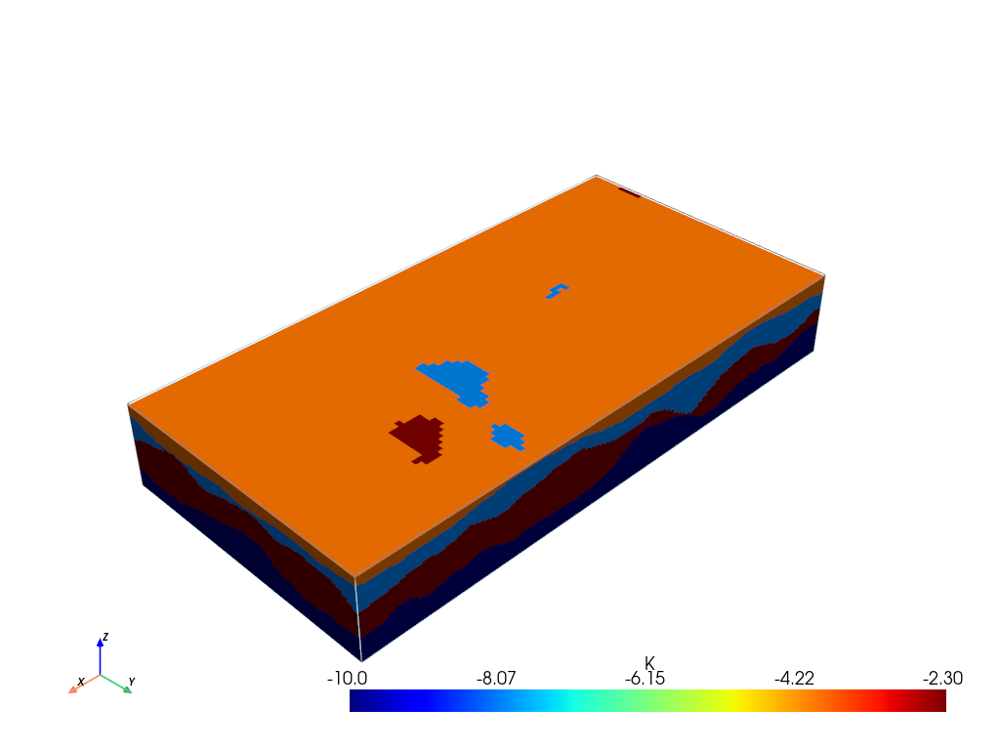

In [349]:
T1.plot_prop("K", cmap="jet", v_ex=3)

In [350]:
archpy_flow = archpy2modflow(T1, exe_name=mf6_exe_path, model_dir="archpy_mode_homo")  # create the modflow model
archpy_flow.create_sim(grid_mode="archpy", iu=0, unit_limit=None)  # create the simulation object and choose a certain discretization
archpy_flow.set_k("K", iu=0, ifa=0, ip=0, log=True, average_facies=True)  # set the hydraulic conductivity

Simulation created with the following parameters:
Grid mode: archpy
To retrieve the simulation, use the get_sim() method


In [351]:
sim = archpy_flow.get_sim()
gwf = archpy_flow.get_gwf()

In [352]:
import flopy as fp

In [353]:
sim.ims.remove()
inner_dvclose = 1e-5
ims = fp.mf6.ModflowIms(sim, complexity="moderate", inner_dvclose=inner_dvclose)

In [354]:
import flopy as fp

In [355]:
# add BC at left and right on all layers
h1 = .3
h2 = 0
T_1 = 10  # temperature at left boundary
T_2 = 10  # temperature at right boundary
chd_data = []

a = np.zeros((gwf.modelgrid.nlay, gwf.modelgrid.nrow, gwf.modelgrid.ncol), dtype=bool)
a[:, :, 0] = 1
lst_chd = array2cellids(a, gwf.dis.idomain.array)
for cellid in lst_chd:
    chd_data.append((cellid, h1, T_1))

chd1 = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_data, save_flows=True, auxiliary="TEMPERATURE", pname="CHD-1")

chd_data = []
a = np.zeros((gwf.modelgrid.nlay, gwf.modelgrid.nrow, gwf.modelgrid.ncol), dtype=bool)
a[:, :, -1] = 1
lst_chd = array2cellids(a, gwf.dis.idomain.array)
for cellid in lst_chd:
    chd_data.append((cellid, h2, T_2))

chd2 = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_data, save_flows=True, auxiliary="TEMPERATURE", pname="CHD-2")

Wells at ($75.0, 25.0, 4.5$) and ($60.0, 25.0, 4.5$)

In [356]:
# add an injection well in the middle of the model
well_data = []
Q_well = 0.0015  # m3/s
T_well = 7  # temperature of the injected water
cellid_well = (21, T1.ny // 2, T1.nx // 2)
well_data.append((cellid_well, Q_well, T_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, auxiliary="TEMPERATURE", pname="WEL-INJ")

# production well
well_data = []
Q_well = -0.0015  # m3/s
cellid_well = (21, T1.ny // 2, int(T1.nx // 2.5))
well_data.append((cellid_well, Q_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, pname="WEL-PROD")

In [357]:
sim.write_simulation()
sim.run_simulation()

writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ims_-1...
  writing model test...
    writing model name file...
    writing package dis...
    writing package ic...
    writing package oc...
    writing package npf...
    writing package chd-1...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 2450 based on size of stress_period_data
    writing package chd-2...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 2450 based on size of stress_period_data
    writing package wel-inj...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
    writing package wel-prod...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SU

(True, [])

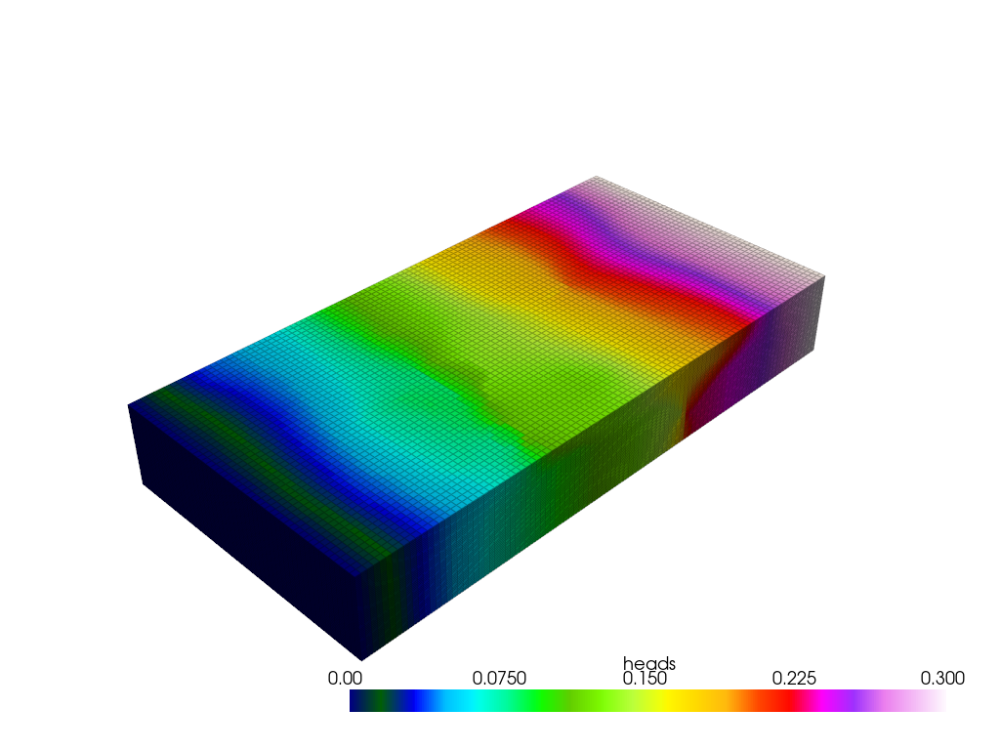

In [358]:
from flopy.export.vtk import Vtk

vert_exag = 3
vtk = Vtk(model=gwf, binary=False, vertical_exageration=vert_exag, smooth=True)
vtk.add_model(gwf)

heads = archpy_flow.get_heads()
vtk.add_array(heads, name="heads")
vtk.add_array(np.log10(gwf.npf.k.array), name="K")

gwf_mesh = vtk.to_pyvista()
ghosts = np.argwhere(gwf_mesh["idomain"] <= 0)
gwf_mesh.remove_cells(ghosts, inplace=True)

pl = pv.Plotter(notebook=True)
# pl.add_mesh(gwf_mesh, opacity=1, show_edges=True, scalars="heads", cmap="viridis", edge_opacity=0.3, clim=[0, 0.3])

pl.add_mesh(gwf_mesh, opacity=1, show_edges=True, scalars="heads", cmap="gist_ncar", edge_opacity=0.3, clim=[0, 0.3])
# pl.show(screenshot="E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_archpy_ho.png", window_size=[1300, 900], auto_close=False)
pl.show()

In [359]:
heads = archpy_flow.get_heads()

Text(0, 0.5, 'Z [m]')

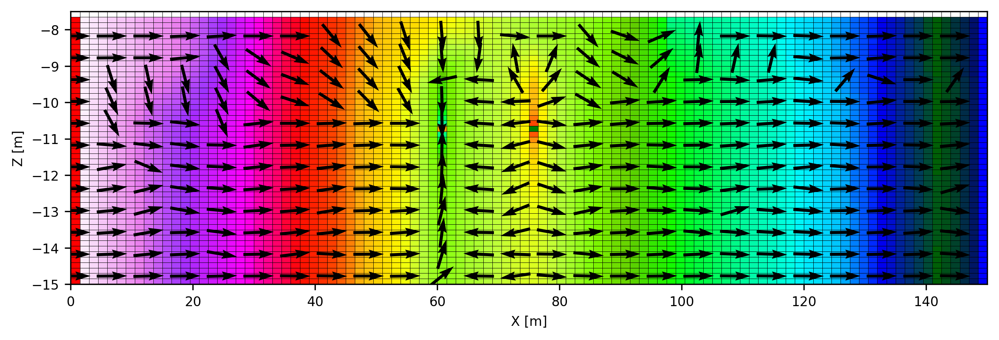

In [360]:
cobj = gwf.output.budget()
qx, qy, qz = fp.utils.postprocessing.get_specific_discharge(
        cobj.get_data(text="DATA-SPDIS", kstpkper=(0, 0))[0], gwf)

# plot cross section
from flopy.plot import PlotCrossSection
fig, ax = plt.subplots(1, 1, figsize=(10, 3), dpi=300)
cross_section = PlotCrossSection(model=gwf, line={"row": 25})
cross_section.plot_array(heads, cmap="gist_ncar", ax=ax)
cross_section.plot_bc("CHD-1", color="red", ax=ax)
cross_section.plot_bc("CHD-2", color="blue", ax=ax)
cross_section.plot_bc("WEL-INJ", color="green", ax=ax)
cross_section.plot_bc("WEL-PROD", color="orange", ax=ax)
cross_section.plot_vector(qx, qy, qz, color="black", normalize=True, kstep=4, hstep=4, ax=ax, scale=30)
cross_section.plot_grid(linewidth=0.2, color="black")

plt.xlabel("X [m]")
plt.ylabel("Z [m]")

# fig.savefig("E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_archpy_ho_cross_section.png", dpi=300, bbox_inches="tight")

In [361]:
np.random.seed(15)

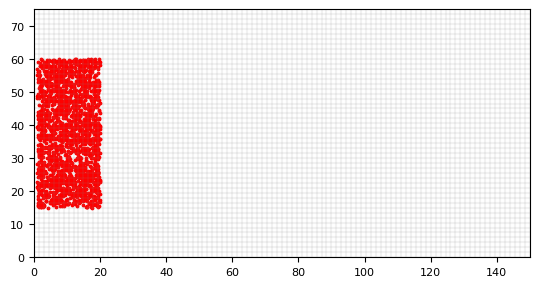

In [362]:
n = 2000
xp = np.random.uniform(1, 20, n)
yp = np.random.uniform(T1.yg[-1]*0.2 + T1.yg[0], T1.yg[-1]*0.8, n)
zp = np.random.uniform(-9, -11, n)
list_p_coords = []
for i in range(n):
    list_p_coords.append((xp[i], yp[i], zp[i]))
plt.scatter(xp, yp, c="red", s=3)
gwf.modelgrid.plot(alpha=.1)

In [363]:
archpy_flow.prt_create(prt_name="test_prt", workspace="ws_prt", trackdir="forward", list_p_coords=list_p_coords)
archpy_flow.set_porosity(prop_key="Porosity", iu=0, ifa=0, ip=0)
archpy_flow.prt_run(silent=False)

c:\Users\schorppl\.conda\envs\archpy_work\Lib\site-packages\flopy\utils\gridintersect.py:123: DeprecationWarning: Note `method="structured"` is deprecated. Pass `method="vertex"` to silence this warning. This will be the new default in a future release and this keyword argument will be removed.
  warnings.warn(


writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ems...
  writing model test_prt...
    writing model name file...
    writing package mip...
    writing package dis...
    writing package prp...
    writing package oc...
    writing package fmi...
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.6.1 02/10/2025

   MODFLOW 6 compiled Feb 14 2025 13:40:10 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to furt

In [364]:
df_all = archpy_flow.prt_get_pathlines()

In [365]:
t_well_layhe = []
t_bc_layhe = []
for i in range(1, 2000):
    xmax = df_all.loc[df_all.irpt==i].iloc[-1].x
    if xmax < 65:
        t_well_layhe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)
    else:
        t_bc_layhe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)

t_well_layhe = np.array(t_well_layhe)
t_bc_layhe = np.array(t_bc_layhe)
np.save("t_well_apho.npy", t_well_layhe)
np.save("t_bc_apho.npy", t_bc_layhe)

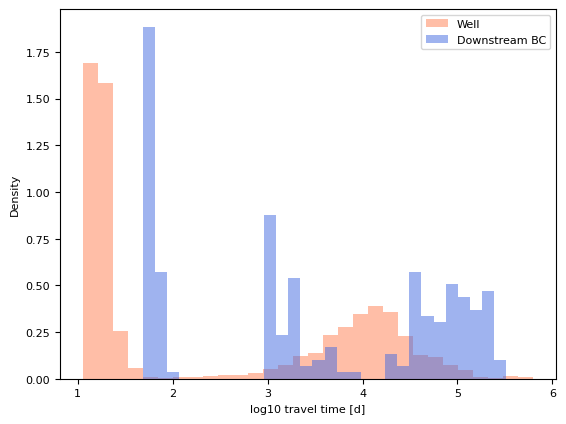

In [366]:
plt.hist(np.log10(t_well_layhe / 86400), density=True, alpha=.5, label="Well", color="coral", bins=30)
plt.hist(np.log10(t_bc_layhe / 86400), density=True, alpha=.5, label="Downstream BC", color="royalblue", bins=30)

plt.xlabel("log10 travel time [d]")
plt.ylabel("Density")

plt.legend()

## Layered homogeneous mode

In [27]:
import ArchPy.ap_mf

In [20]:
archpy_flow = archpy2modflow(T1, exe_name=mf6_exe_path, model_dir="layered_homo")  # create the modflow model
archpy_flow.create_sim(grid_mode="layers", iu=0, unit_limit=None, lay_sep=[1, 1, 3, 1], factor_x=2, factor_y=2, factor_z=2)  # create the simulation object and choose a certain discretization
archpy_flow.set_k("K", iu=0, ifa=0, ip=0, log=True, k_average_method="anisotropic", average_facies=True)  # set the hydraulic conductivity

Simulation created with the following parameters:
Grid mode: layers
To retrieve the simulation, use the get_sim() method


In [21]:
sim = archpy_flow.get_sim()
gwf = archpy_flow.get_gwf()

In [22]:
sim.ims.remove()
inner_dvclose = 1e-5
ims = fp.mf6.ModflowIms(sim, complexity="moderate", inner_dvclose=inner_dvclose)

In [23]:
# add BC at left and right on all layers
h1 = .3
h2 = 0
T_1 = 10  # temperature at left boundary
T_2 = 10  # temperature at right boundary
chd_data = []

a = np.zeros((gwf.modelgrid.nlay, gwf.modelgrid.nrow, gwf.modelgrid.ncol), dtype=bool)
a[:, :, 0] = 1
lst_chd = array2cellids(a, gwf.dis.idomain.array)
for cellid in lst_chd:
    chd_data.append((cellid, h1, T_1))

chd1 = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_data, save_flows=True, auxiliary="TEMPERATURE", pname="CHD-1")

chd_data = []
a = np.zeros((gwf.modelgrid.nlay, gwf.modelgrid.nrow, gwf.modelgrid.ncol), dtype=bool)
a[:, :, -1] = 1
lst_chd = array2cellids(a, gwf.dis.idomain.array)
for cellid in lst_chd:
    chd_data.append((cellid, h2, T_2))

chd2 = fp.mf6.ModflowGwfchd(gwf, stress_period_data=chd_data, save_flows=True, auxiliary="TEMPERATURE", pname="CHD-2")

In [24]:
# add an injection well in the middle of the model
well_data = []
Q_well = 0.0015  # m3/s
T_well = 7  # temperature of the injected water
cellid_well = (2, T1.ny // 2, T1.nx // 2)
well_data.append((cellid_well, Q_well, T_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, auxiliary="TEMPERATURE", pname="WEL-INJ")

# production well
well_data = []
Q_well = -Q_well # m3/s
cellid_well = (2, T1.ny // 2, int(T1.nx // 2.5))
well_data.append((cellid_well, Q_well))
wel = fp.mf6.ModflowGwfwel(gwf, stress_period_data=well_data, save_flows=True, pname="WEL-PROD")

In [29]:
# update the hydraulic conductivity

k_aquifer = 5e-3
k = np.array([1e-4, 1e-8, k_aquifer, k_aquifer, k_aquifer, 1e-10])
archpy_flow.set_k(k=k, average_facies=True)

In [32]:
sim.write_simulation()
sim.run_simulation()

writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ims_-1...
  writing model test...
    writing model name file...
    writing package dis...
    writing package ic...
    writing package oc...
    writing package chd-1...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 300 based on size of stress_period_data
    writing package chd-2...
INFORMATION: maxbound in ('gwf6', 'chd', 'dimensions') changed to 297 based on size of stress_period_data
    writing package wel-inj...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
    writing package wel-prod...
INFORMATION: maxbound in ('gwf6', 'wel', 'dimensions') changed to 1 based on size of stress_period_data
    writing package npf...
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURV

(True, [])

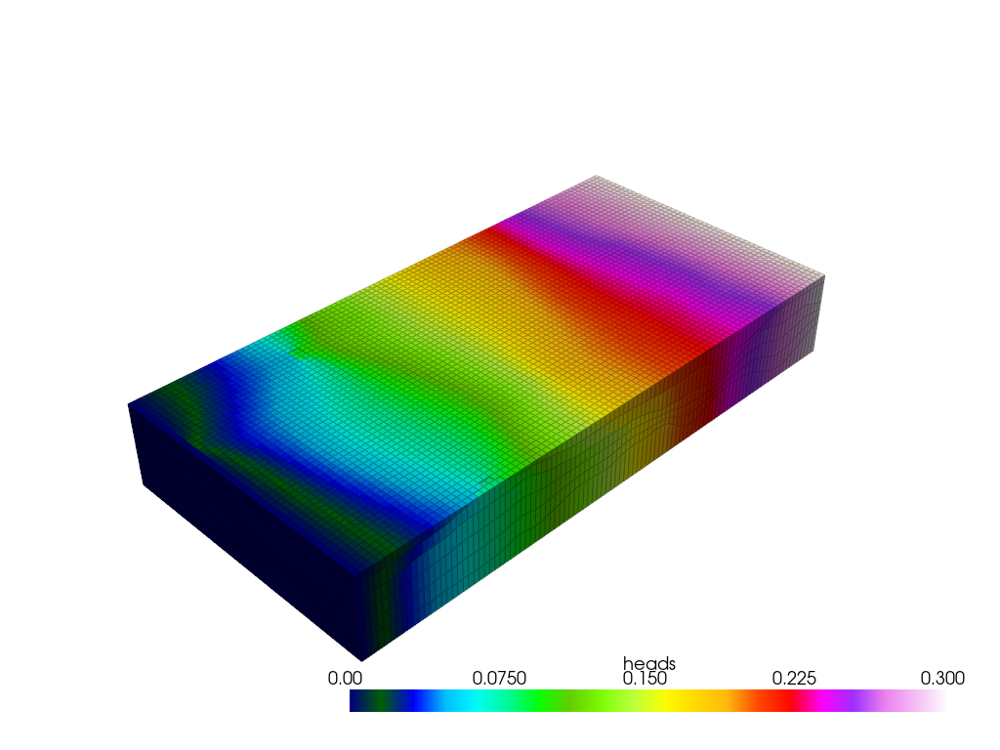

In [33]:
from flopy.export.vtk import Vtk

vert_exag = 3
vtk = Vtk(model=gwf, binary=False, vertical_exageration=vert_exag, smooth=True)
vtk.add_model(gwf)

heads = archpy_flow.get_heads()
vtk.add_array(heads, name="heads")
vtk.add_array(np.log10(gwf.npf.k.array), name="K")

gwf_mesh = vtk.to_pyvista()
ghosts = np.argwhere(gwf_mesh["idomain"] <= 0)
gwf_mesh.remove_cells(ghosts, inplace=True)

pl = pv.Plotter(notebook=True)
pl.add_mesh(gwf_mesh, opacity=1, show_edges=True, scalars="heads", cmap="gist_ncar", edge_opacity=0.3)
# pl.show(screenshot="../../../figures/articles/archpy 2/raw/flow_lay_ho.png", window_size=[1300, 900], auto_close=False)
# pl.show(screenshot="E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_lay_ho.png", window_size=[1300, 900], auto_close=False)
pl.show()

In [34]:
heads = archpy_flow.get_heads()

Text(0, 0.5, 'Z [m]')

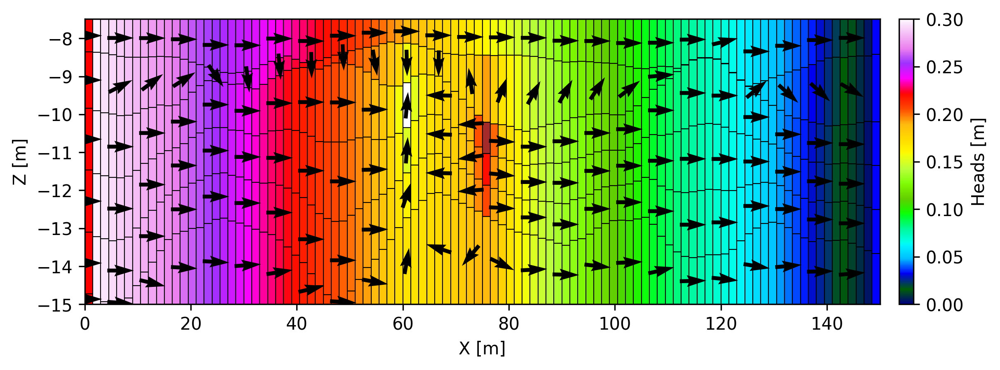

In [35]:
cobj = gwf.output.budget()
qx, qy, qz = fp.utils.postprocessing.get_specific_discharge(
        cobj.get_data(text="DATA-SPDIS", kstpkper=(0, 0))[0], gwf)

# plot cross section
from flopy.plot import PlotCrossSection
fig, ax = plt.subplots(1, 1, figsize=(10, 3), dpi=300)
cross_section = PlotCrossSection(model=gwf, line={"row": 25})
# cross_section.plot_array(np.log10(gwf.npf.k.array), cmap="Blues", ax=ax)
cont = cross_section.plot_array(heads, cmap="gist_ncar", ax=ax)
# cont = cross_section.contour_array(heads, ax=ax, levels=np.arange(0, 0.25, 0.02), linewidths=3)
# plt.clabel(cont, inline=True, fontsize=20, fmt="%.2f", colors="black")
cross_section.plot_bc("CHD-1", color="red", ax=ax)
cross_section.plot_bc("CHD-2", color="blue", ax=ax)
cross_section.plot_bc("WEL-INJ", color="brown", ax=ax)
cross_section.plot_bc("WEL-PROD", color="white", ax=ax)
cross_section.plot_vector(qx, qy, qz, color="black", normalize=True, hstep=4, kstep=1, ax=ax, scale=30)
cross_section.plot_grid(linewidth=0.5, color="black")
plt.colorbar(cont, ax=ax, label="Heads [m]", orientation="vertical", pad=0.02)
plt.xlabel("X [m]")
plt.ylabel("Z [m]")

# fig.savefig("E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/flow_lay_ho_cross_section.png", dpi=300, bbox_inches="tight")

In [36]:
np.random.seed(15)

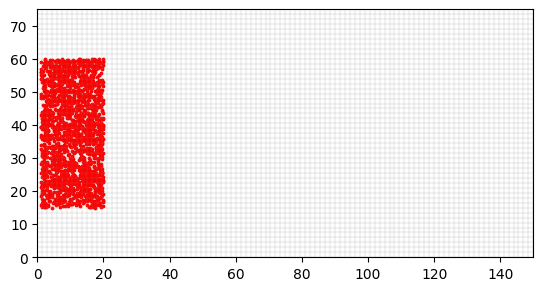

In [37]:
n = 2000
xp = np.random.uniform(1, 20, n)
yp = np.random.uniform(T1.yg[-1]*0.2 + T1.yg[0], T1.yg[-1]*0.8, n)
zp = np.random.uniform(-9, -11, n)
list_p_coords = []
for i in range(n):
    list_p_coords.append((xp[i], yp[i], zp[i]))
plt.scatter(xp, yp, c="red", s=3)
gwf.modelgrid.plot(alpha=.1)

In [38]:
archpy_flow.prt_create(prt_name="test_prt", workspace="ws_prt", trackdir="forward", list_p_coords=list_p_coords)
archpy_flow.set_porosity(prop_key="Porosity", iu=0, ifa=0, ip=0)
archpy_flow.prt_run(silent=False)

c:\Users\schorppl\.conda\envs\archpy_work\Lib\site-packages\flopy\utils\gridintersect.py:123: DeprecationWarning: Note `method="structured"` is deprecated. Pass `method="vertex"` to silence this warning. This will be the new default in a future release and this keyword argument will be removed.
  warnings.warn(


writing simulation...
  writing simulation name file...
  writing simulation tdis package...
  writing solution package ems...
  writing model test_prt...
    writing model name file...
    writing package mip...
    writing package dis...
    writing package prp...
    writing package oc...
    writing package fmi...
FloPy is using the following executable to run the model: \\home\schorppl$\exe\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.6.1 02/10/2025

   MODFLOW 6 compiled Feb 14 2025 13:40:10 with Intel(R) Fortran Intel(R) 64
   Compiler Classic for applications running on Intel(R) 64, Version 2021.7.0
                             Build 20220726_000000

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to furt

In [39]:
df_all = archpy_flow.prt_get_pathlines()

In [40]:
t_well_layhe = []
t_bc_layhe = []
for i in range(1, 2000):
    xmax = df_all.loc[df_all.irpt==i].iloc[-1].x
    if xmax < 65:
        t_well_layhe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)
    else:
        t_bc_layhe.append(df_all.loc[df_all.irpt==i].iloc[-1].t)

t_well_layhe = np.array(t_well_layhe)
t_bc_layhe = np.array(t_bc_layhe)
np.save("t_well_layho.npy", t_well_layhe)
np.save("t_bc_layho.npy", t_bc_layhe)

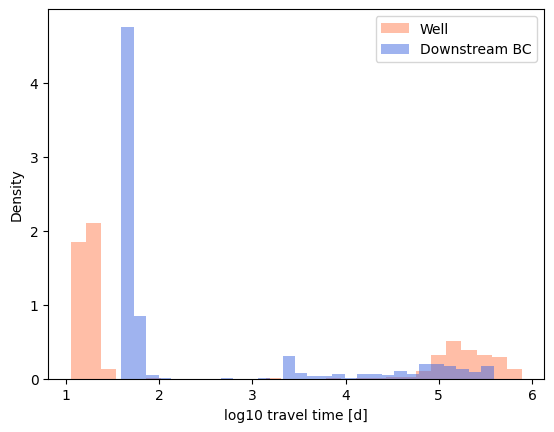

In [41]:
plt.hist(np.log10(t_well_layhe / 86400), density=True, alpha=.5, label="Well", color="coral", bins=30)
plt.hist(np.log10(t_bc_layhe / 86400), density=True, alpha=.5, label="Downstream BC", color="royalblue", bins=30)

plt.xlabel("log10 travel time [d]")
plt.ylabel("Density")

plt.legend()

In [42]:
t_well_layhe = np.load("t_well_layhe.npy")
t_bc_layhe = np.load("t_bc_layhe.npy")
t_well_aphe = np.load("t_well_aphe.npy")
t_bc_aphe = np.load("t_bc_aphe.npy")
t_well_layho = np.load("t_well_layho.npy")
t_bc_layho = np.load("t_bc_layho.npy")
t_well_apho = np.load("t_well_apho.npy")
t_bc_apho = np.load("t_bc_apho.npy")
t_well_nrhe = np.load("t_well_nrhe.npy")
t_bc_nrhe = np.load("t_bc_nrhe.npy")
t_well_mghe = np.load("t_well_mghe.npy")
t_bc_mghe = np.load("t_bc_mghe.npy")

In [43]:
df_plot_well = pd.DataFrame([np.log10(t_well_aphe / 86400),np.log10(t_well_apho / 86400), np.log10(t_well_layhe / 86400), np.log10(t_well_apho / 86400), np.log10(t_well_nrhe / 86400), np.log10(t_well_mghe / 86400)]).T

df_plot_bc = pd.DataFrame([np.log10(t_bc_aphe / 86400), np.log10(t_bc_apho / 86400), np.log10(t_bc_layhe / 86400), np.log10(t_bc_layho / 86400), np.log10(t_bc_nrhe / 86400), np.log10(t_bc_mghe / 86400)]).T
df_plot_bc.columns = ["Ap-he", "Ap-ho", "Lay-he", "Lay-ho", "NR-he", "MG-he"]
df_plot_well.columns = ["Ap-he", "Ap-ho", "Lay-he", "Lay-ho", "NR-he", "MG-he"]


In [44]:
import seaborn as sns

In [45]:
sns.set_palette("colorblind")

In [46]:
# default fontsize
matplotlib.rcParams.update({'font.size': 10})

C:\Users\schorppl\AppData\Local\Temp\ipykernel_23664\605621732.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_i.set_xticklabels(ax_i.get_xticklabels(), rotation=45, ha="center")
C:\Users\schorppl\AppData\Local\Temp\ipykernel_23664\605621732.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_i.set_xticklabels(ax_i.get_xticklabels(), rotation=45, ha="center")


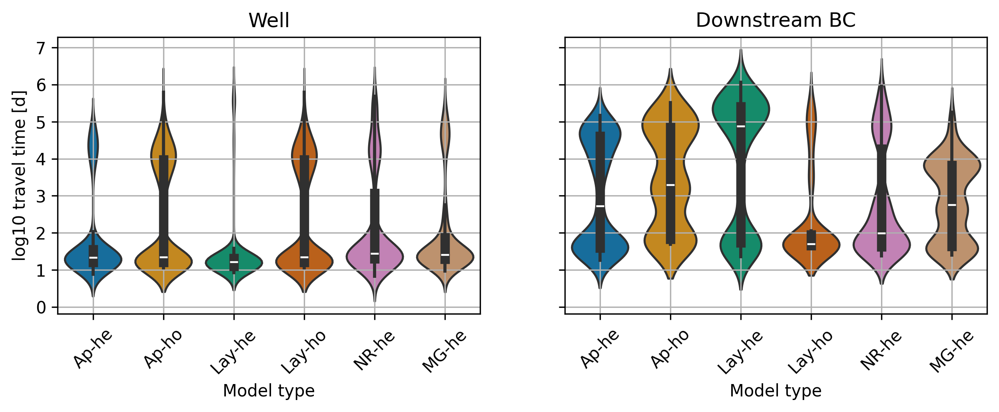

In [47]:
fig, ax= plt.subplots(1, 2, figsize=(10, 3), dpi=300, sharey=True)

axi = ax[0]
sns.violinplot(data=df_plot_well, ax=axi)
axi.set_ylabel("log10 travel time [d]")
axi.set_title("Well")

axi = ax[1]
sns.violinplot(data=df_plot_bc, ax=axi)

axi.set_title("Downstream BC")

# rotate x labels
for ax_i in ax:
    ax_i.set_xticklabels(ax_i.get_xticklabels(), rotation=45, ha="center")
    ax_i.set_xlabel("Model type")
    ax_i.grid(True)

# fig.savefig("E:/switchdrive/Post_doc/figures/articles/archpy 2/raw/travel_time_violin.png", dpi=300, bbox_inches="tight")